In [1]:
import numpy as np
import pandas as pd
import os
import matplotlib.pyplot as plt
import json
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score, mean_squared_error
from itertools import combinations


# allow dataframes to show all columns
pd.set_option('display.max_columns', None)

In [2]:
df = pd.read_csv("ramp_downhill.csv")
df.head()

,id,file,side,step_length,stride_length,speed,gc_dur,stance,cadence,hs1_sec,hs2_sec,to_sec,start_frame,hs1_frame,hs2_frame,to_frame,slope,condition,height,weight,age
0,11,11_1F_2,Left,0.653310,1.278924,1.117940,1.144,0.597902,102.671668,0.132,1.276,0.816,31,33,319,204,-18,self-selected,180.0,76.0,23
1,11,11_1F_2,Right,0.575531,1.228806,1.089367,1.128,0.613475,113.568087,0.688,1.816,1.380,31,172,454,345,-18,self-selected,180.0,76.0,23
2,11,11_1K_3,Left,0.698530,1.338955,1.170415,1.144,0.597902,100.532497,0.096,1.240,0.780,22,24,310,195,-18,constant,180.0,76.0,23
3,11,11_1K_3,Right,0.699632,1.398149,1.184872,1.180,0.593220,101.613868,0.660,1.840,1.360,22,165,460,340,-18,constant,180.0,76.0,23
4,11,11_2F_1,Left,0.685120,1.303506,1.104666,1.180,0.583051,96.742068,0.136,1.316,0.824,32,34,329,206,-12,self-selected,180.0,76.0,23


In [3]:
with open("MuscleJointForces_downhill.json", "r") as f:
    data = json.load(f)

In [4]:
df_all = pd.json_normalize(data)
df_all.columns = df_all.columns.str.replace(r"^results\.", "", regex=True)
df_all.head()

,file,side,GRF_ap,GRF_ml,GRF_vert,angleHip,angleKnee,angleAnkle,momentHip,momentKnee,momentAnkle,ankleFres,kneeFres,hipFres,knee_PFc,gastrocnemius,soleus,tib_ant,quadriceps,iliopsoas,hamstrings,glut_max
0,11_1F_2,Left,"[14.754200319555064, 18.912309344826987, 22.98...","[-1.3715455322886239, -2.60016714213597, -4.14...","[88.49850114087053, 116.81301153744096, 147.77...","[23.11970903388696, 23.309768192680707, 23.523...","[7.580195073887036, 8.112639291594181, 8.70766...","[3.7678227120168204, 3.4415852315374624, 3.094...","[16.63287453541254, 24.065055010039178, 31.950...","[-13.857913524211412, -15.870451168632028, -17...","[-3.1485837547315914, -4.469778826614926, -6.0...","[394.68391495815433, 429.81289654858523, 465.1...","[560.0616124302376, 657.3946049910797, 781.935...","[752.1144931344963, 871.8762377814713, 1033.83...","[3.2380869044055294e-08, 1.1732621863216089e-0...","[84.96180226295617, 65.70585493023083, 41.6241...","[3.2943171191056034e-08, 1.1740339184142212e-0...","[176.38100095031484, 191.629313989953, 207.527...","[5.2125076463242117e-08, 1.864875651977497e-08...","[83.26766663728114, 77.17933833075641, 78.3861...","[362.22294477843997, 452.0210137914681, 566.13...","[8.925436591790988e-07, 5.083358806623616, 8.0..."
1,11_1F_2,Right,"[14.019394623448846, 16.54752373052943, 18.458...","[1.026029499850483, 0.8009821609932601, 0.4176...","[88.11956142717656, 116.47818235269114, 147.54...","[22.191209060403597, 22.304023552664418, 22.44...","[13.606344174955472, 14.189785189696607, 14.83...","[7.992639049878598, 7.822939112077673, 7.63622...","[11.106311173373069, 17.004631066661812, 22.80...","[-11.623237519464524, -12.310145563421122, -12...","[-2.282079067271943, -3.271463104128628, -4.46...","[350.8691773260563, 351.83055343164006, 361.57...","[455.7122531312876, 484.37806130501565, 547.12...","[653.886955140613, 716.5097673832856, 813.0375...","[5.407310987679742e-11, 6.307605881972114e-09,...","[66.11529269705329, 32.735130377895764, 1.9716...","[4.731476188140097e-11, 5.379522917968298e-09,...","[147.4796339677098, 142.40576806106415, 141.56...","[7.810866650057915e-11, 8.978042484973225e-09,...","[76.3778536331347, 60.5071284669632, 56.458943...","[280.65043795478795, 324.296768993416, 392.342...","[1.1576766825634846e-09, 8.676547692965617, 13..."
2,11_1K_3,Left,"[9.429961991945866, 9.340841983225303, 8.16930...","[3.4425211943193355, 2.9945048919933983, 2.143...","[138.7897836900715, 181.53336237781622, 228.28...","[17.895441689720638, 18.109463768161685, 18.34...","[8.239329335860647, 8.945025919863918, 9.70789...","[7.831656644416162, 7.478930850804061, 7.09810...","[22.78806326481839, 29.979831210441002, 36.983...","[-14.272388807133616, -15.018760259452398, -14...","[-3.6531354512311824, -5.549440673363604, -7.8...","[415.38235006751023, 433.7150073900413, 523.22...","[629.11461721485, 718.8791806478171, 782.29753...","[962.8397283823093, 1110.524774710165, 1171.09...","[9.187064184845183e-10, 5.697195572078916e-09,...","[56.88031077288465, 14.749651061901128, 2.6207...","[8.441105569970356e-10, 5.7496904985480135e-09...","[170.70999554436202, 176.86849796418878, 218.4...","[1.4435282659132238e-09, 8.838779138101165e-09...","[115.64974425205095, 107.75072707865156, 75.81...","[422.0605383766697, 511.4376776942769, 560.479...","[1.14037694938436e-07, 6.839783427937151, 25.6..."
3,11_1K_3,Right,"[10.386012932655106, 9.53512269567237, 7.37720...","[8.140293625764647, 9.286994267355297, 10.2706...","[119.94664003379371, 158.57531760916373, 201.5...","[19.49775808106458, 19.701253204733273, 19.924...","[12.787580373406977, 13.561564317995675, 14.38...","[7.713202485879993, 7.493746397505441, 7.25453...","[11.513682094495506, 16.452024076036235, 21.04...","[-7.5648508951440645, -6.66735122355985, -4.90...","[-5.306948473009778, -7.162172800051598, -9.28...","[349.7386666441944, 458.07854810015874, 578.35...","[327.6868901138671, 356.7855578396026, 355.358...","[642.8465310816695, 670.1796472142004, 735

In [5]:
df_all['angleHip_length'] = df_all['angleHip'].apply(len)
print(df_all[['file', 'side', 'angleHip_length']])

        file   side  angleHip_length
0    11_1F_2   Left              286
1    11_1F_2  Right              281
2    11_1K_3   Left              286
3    11_1K_3  Right              294
4    11_2F_1   Left              295
..       ...    ...              ...
363  25_2K_3  Right              258
364  15_4F_3   Left              267
365  15_4F_3  Right              269
366  15_4K_2   Left              317
367  15_4K_2  Right              309

[368 rows x 3 columns]


In [6]:
# merge data
df_merged = pd.merge(df_all, df, on=["file", "side"])
df_merged.head()

,file,side,GRF_ap,GRF_ml,GRF_vert,angleHip,angleKnee,angleAnkle,momentHip,momentKnee,momentAnkle,ankleFres,kneeFres,hipFres,knee_PFc,gastrocnemius,soleus,tib_ant,quadriceps,iliopsoas,hamstrings,glut_max,angleHip_length,id,step_length,stride_length,speed,gc_dur,stance,cadence,hs1_sec,hs2_sec,to_sec,start_frame,hs1_frame,hs2_frame,to_frame,slope,condition,height,weight,age
0,11_1F_2,Left,"[14.754200319555064, 18.912309344826987, 22.98...","[-1.3715455322886239, -2.60016714213597, -4.14...","[88.49850114087053, 116.81301153744096, 147.77...","[23.11970903388696, 23.309768192680707, 23.523...","[7.580195073887036, 8.112639291594181, 8.70766...","[3.7678227120168204, 3.4415852315374624, 3.094...","[16.63287453541254, 24.065055010039178, 31.950...","[-13.857913524211412, -15.870451168632028, -17...","[-3.1485837547315914, -4.469778826614926, -6.0...","[394.68391495815433, 429.81289654858523, 465.1...","[560.0616124302376, 657.3946049910797, 781.935...","[752.1144931344963, 871.8762377814713, 1033.83...","[3.2380869044055294e-08, 1.1732621863216089e-0...","[84.96180226295617, 65.70585493023083, 41.6241...","[3.2943171191056034e-08, 1.1740339184142212e-0...","[176.38100095031484, 191.629313989953, 207.527...","[5.2125076463242117e-08, 1.864875651977497e-08...","[83.26766663728114, 77.17933833075641, 78.3861...","[362.22294477843997, 452.0210137914681, 566.13...","[8.925436591790988e-07, 5.083358806623616, 8.0...",286,11,0.653310,1.278924,1.117940,1.144,0.597902,102.671668,0.132,1.276,0.816,31,33,319,204,-18,self-selected,180.0,76.0,23
1,11_1F_2,Right,"[14.019394623448846, 16.54752373052943, 18.458...","[1.026029499850483, 0.8009821609932601, 0.4176...","[88.11956142717656, 116.47818235269114, 147.54...","[22.191209060403597, 22.304023552664418, 22.44...","[13.606344174955472, 14.189785189696607, 14.83...","[7.992639049878598, 7.822939112077673, 7.63622...","[11.106311173373069, 17.004631066661812, 22.80...","[-11.623237519464524, -12.310145563421122, -12...","[-2.282079067271943, -3.271463104128628, -4.46...","[350.8691773260563, 351.83055343164006, 361.57...","[455.7122531312876, 484.37806130501565, 547.12...","[653.886955140613, 716.5097673832856, 813.0375...","[5.407310987679742e-11, 6.307605881972114e-09,...","[66.11529269705329, 32.735130377895764, 1.9716...","[4.731476188140097e-11, 5.379522917968298e-09,...","[147.4796339677098, 142.40576806106415, 141.56...","[7.810866650057915e-11, 8.978042484973225e-09,...","[76.3778536331347, 60.5071284669632, 56.458943...","[280.65043795478795, 324.296768993416, 392.342...","[1.1576766825634846e-09, 8.676547692965617, 13...",281,11,0.575531,1.228806,1.089367,1.128,0.613475,113.568087,0.688,1.816,1.380,31,172,454,345,-18,self-selected,180.0,76.0,23
2,11_1K_3,Left,"[9.429961991945866, 9.340841983225303, 8.16930...","[3.4425211943193355, 2.9945048919933983, 2.143...","[138.7897836900715, 181.53336237781622, 228.28...","[17.895441689720638, 18.109463768161685, 18.34...","[8.239329335860647, 8.945025919863918, 9.70789...","[7.831656644416162, 7.478930850804061, 7.09810...","[22.78806326481839, 29.979831210441002, 36.983...","[-14.272388807133616, -15.018760259452398, -14...","[-3.6531354512311824, -5.549440673363604, -7.8...","[415.38235006751023, 433.7150073900413, 523.22...","[629.11461721485, 718.8791806478171, 782.29753...","[962.8397283823093, 1110.524774710165, 1171.09...","[9.187064184845183e-10, 5.697195572078916e-09,...","[56.88031077288465, 14.749651061901128, 2.6207...","[8.441105569970356e-10, 5.7496904985480135e-09...","[170.70999554436202, 176.86849796418878, 218.4...","[1.4435282659132238e-09, 8.838779138101165e-09...","[115.64974425205095, 107.75072707865156, 75.81...","[422.0605383766697, 511.4376776942769, 560.479...","[1.14037694938436e-07, 6.839783427937151, 25.6...",286,11,0.698530,1.338955,1.170415,1.144,0.597902,100.532497,0.096,1.240,0.780,22,24,310,195,-18,constant,180.0,76.0,23
3,11_1K_3,Right,"[10.386012932655106, 9.53512269567237, 7.37720...","[8.140293625764647, 9.2

In [7]:
# labels for plotting
label_map = {
    "GRF_ap": "GRF Anterior-Posterior (N)",
    "GRF_ml": "GRF Medio-Lateral (N)",
    "GRF_vert": "GRF Vertical (N)",
    "angleHip": "Hip Angle (°)",
    "angleKnee": "Knee Angle (°)",
    "angleAnkle": "Ankle Angle (°)",
    "momentHip": "Hip Moment (Nm)",
    "momentKnee": "Knee Moment (Nm)",
    "momentAnkle": "Ankle Moment (Nm)",
    "ankleFres": "Ankle Joint Reaction Force (N)",
    "kneeFres": "Knee Joint Reaction Force (N)",
    "hipFres": "Hip Joint Reaction Force (N)",
    "knee_PFc": "Patellofemoral Contact Force (N)",
    "gastrocnemius": "Gastrocnemius Force (N)",
    "soleus": "Soleus Force (N)",
    "tib_ant": "Tibialis Anterior Force (N)",
    "quadriceps": "Quadriceps Force (N)",
    "iliopsoas": "Iliopsoas Force (N)",
    "hamstrings": "Hamstrings Force (N)"
}

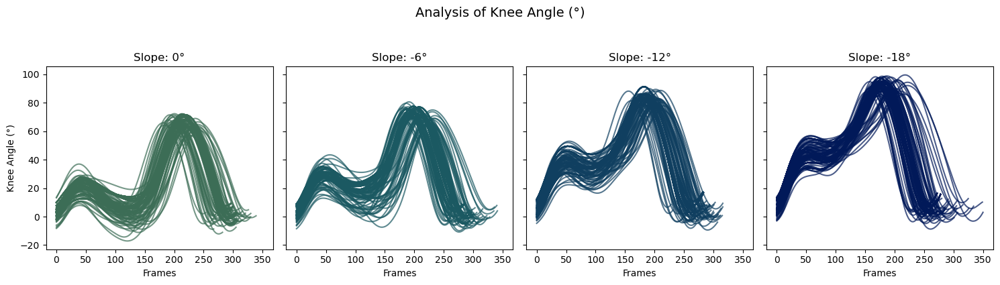

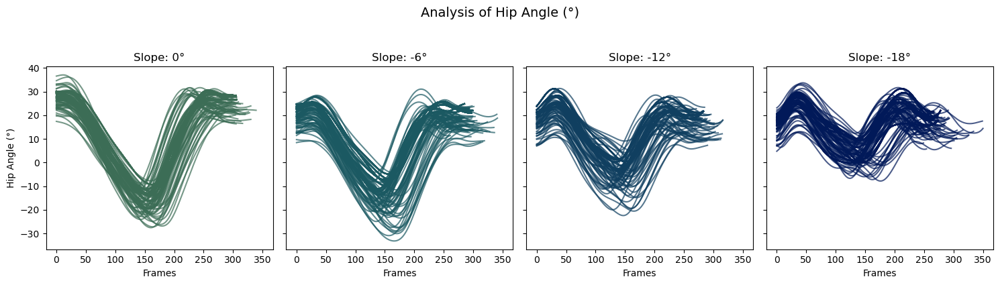

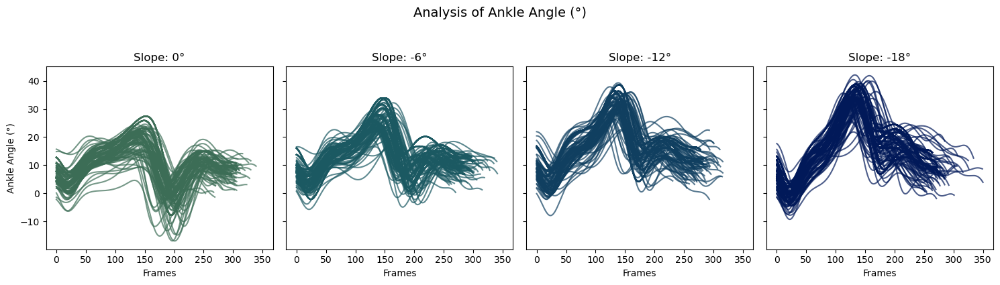

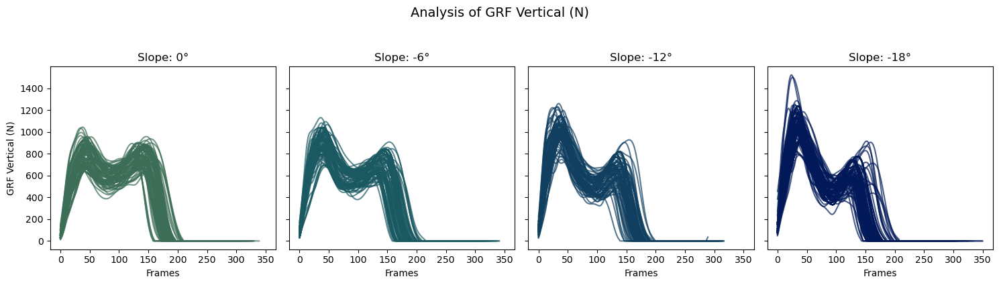

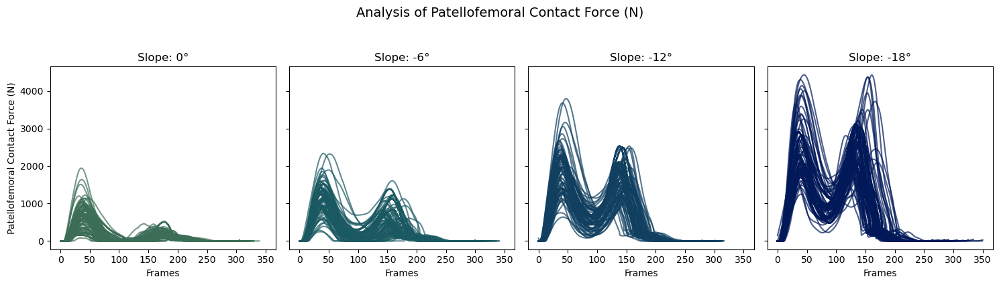

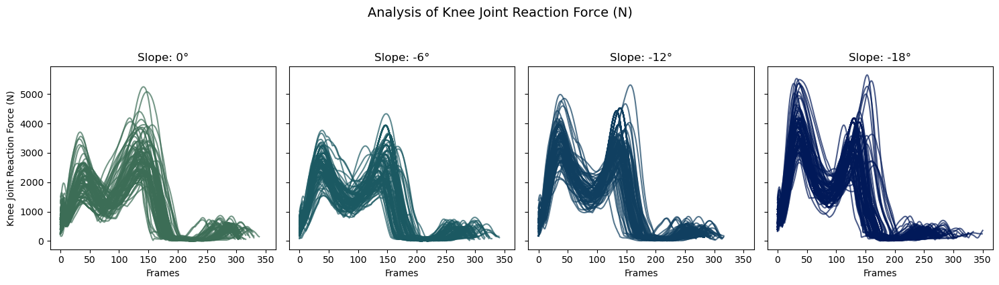

In [8]:
import matplotlib.pyplot as plt
import numpy as np

# 1. Definición del diccionario de colores (Esto faltaba en tu ejecución)
color_slopes = {
    '0': '#3c6d56', 
    '-6': '#1b5962', 
    '-12': '#103f60', 
    '-18': '#011959'
}

# 2. Definición del label_map
label_map = {
    "GRF_ap": "GRF Anterior-Posterior (N)",
    "GRF_ml": "GRF Medio-Lateral (N)",
    "GRF_vert": "GRF Vertical (N)",
    "angleHip": "Hip Angle (°)",
    "angleKnee": "Knee Angle (°)",
    "angleAnkle": "Ankle Angle (°)",
    "momentHip": "Hip Moment (Nm)",
    "momentKnee": "Knee Moment (Nm)",
    "momentAnkle": "Ankle Moment (Nm)",
    "ankleFres": "Ankle Joint Reaction Force (N)",
    "kneeFres": "Knee Joint Reaction Force (N)",
    "hipFres": "Hip Joint Reaction Force (N)",
    "knee_PFc": "Patellofemoral Contact Force (N)",
    "gastrocnemius": "Gastrocnemius Force (N)",
    "soleus": "Soleus Force (N)",
    "tib_ant": "Tibialis Anterior Force (N)",
    "quadriceps": "Quadriceps Force (N)",
    "iliopsoas": "Iliopsoas Force (N)",
    "hamstrings": "Hamstrings Force (N)"
}

variables_a_tracer = ['angleKnee', 'angleHip', 'angleAnkle', 'GRF_vert', 'knee_PFc', 'kneeFres']

# 3. Ordenar pendientes de 0 a -18 (Descendente numéricamente)
slopes = sorted(df_merged['slope'].unique(), reverse=True)

for var in variables_a_tracer:
    # Crear la figura
    fig, axes = plt.subplots(1, 4, figsize=(15, 4), sharex=True, sharey=True)
    axes = axes.flatten()
    
    y_label = label_map.get(var, var)
    
    for i, slope in enumerate(slopes):
        ax = axes[i]
        df_sub = df_merged[df_merged['slope'] == slope]
        
        # Usamos str(int(slope)) para que coincida con las llaves del diccionario '0', '-6', etc.
        color = color_slopes.get(str(int(slope)), "grey")

        for _, row in df_sub.iterrows():
            if isinstance(row[var], (list, np.ndarray)):
                ax.plot(row[var], color=color, alpha=0.7)
        
        ax.set_title(f"Slope: {slope}°")
        ax.set_xlabel('Frames')
        if i == 0: # Solo poner el label en el primero para que no se amontone
            ax.set_ylabel(y_label)

    # Limpiar ejes si hay menos de 4 pendientes
    for j in range(len(slopes), len(axes)):
        fig.delaxes(axes[j])

    fig.suptitle(f"Analysis of {y_label}", y=1.05, fontsize=14)
    fig.tight_layout()
    plt.show()

In [9]:
df = df_merged.copy()

# 0. Datasets

* Datasets for peak 1

In [10]:
extracted_rows_p1 = []

# Loop through each trial
for idx, row in df.iterrows():
    # Safety check: make sure the list is not empty
    if len(row['GRF_vert']) == 0:
        continue
        
    # taking 30% of the graph (approx to find the first peak)
    stance_limit = int(len(row['GRF_vert']) * 0.6)
    mid_stance = int(stance_limit / 2)
    
    # Safety check for very short cycles
    if mid_stance <= 0:
        continue
    
    # Find peak indices
    idx_peak_grf = np.argmax(row['GRF_vert'][:mid_stance]) 
    
    # Function to extract ALL data at a specific index
    def get_all_data_at_index(index, event_name):
        data_point = {}
        # Manually add Event_Type to ensure it exists
        data_point['Event_Type'] = event_name
        
        for col in df.columns:
            val = row[col]
            # If it is a list (time-series data) -> take the value at time T
            if isinstance(val, (list, np.ndarray)):
                try:
                    data_point[col] = val[index]
                except IndexError:
                    data_point[col] = np.nan
            # If it is a constant (ID, Weight, Age, etc.) -> keep it as is
            else:
                data_point[col] = val
                
        return data_point
    

    extracted_rows_p1.append(get_all_data_at_index(idx_peak_grf, 'First_Peak_GRF'))

# Create the final DataFrame
df_peak1 = pd.DataFrame(extracted_rows_p1)

# --- COLUMN REORGANIZATION ---
# Define priority columns
priority_cols = ['id', 'condition', 'Event_Type']

# Retrieve all other columns that are NOT in the priority list
other_cols = [c for c in df_peak1.columns if c not in priority_cols]

# Combine everything: id first, then Event_Type, then the rest
final_order = priority_cols + other_cols
df_peak1 = df_peak1[final_order]

# --- SEPARATION INTO TWO DATAFRAMES ---

# 1. DataFrame for 'self-selected'
df_self_selected = df_peak1[df_peak1['condition'] == 'self-selected'].copy()

# 2. DataFrame for 'constant'
df_constant = df_peak1[df_peak1['condition'] == 'constant'].copy()

# --- DISPLAY RESULTS ---
print(f"Number of rows (Self Selected): {len(df_self_selected)}")
print(f"Number of rows (Constant): {len(df_constant)}")

print("\n--- Preview Self Selected ---")
display(df_self_selected.head(20))

print("\n--- Preview Constant ---")
display(df_constant.head(20))

Number of rows (Self Selected): 384
Number of rows (Constant): 344

--- Preview Self Selected ---


,id,condition,Event_Type,file,side,GRF_ap,GRF_ml,GRF_vert,angleHip,angleKnee,angleAnkle,momentHip,momentKnee,momentAnkle,ankleFres,kneeFres,hipFres,knee_PFc,gastrocnemius,soleus,tib_ant,quadriceps,iliopsoas,hamstrings,glut_max,angleHip_length,step_length,stride_length,speed,gc_dur,stance,cadence,hs1_sec,hs2_sec,to_sec,start_frame,hs1_frame,hs2_frame,to_frame,slope,height,weight,age
0,11,self-selected,First_Peak_GRF,11_1F_2,Left,-99.191641,59.876510,998.246821,33.186485,43.000049,0.634695,50.701807,130.894594,2.024662,1418.414734,4034.987589,3225.945249,2636.425528,2.339626e-11,6.867935e+01,1.467210e+02,2850.295109,1.494592e-10,416.009816,219.542875,286,0.653310,1.278924,1.117940,1.144,0.597902,102.671668,0.132,1.276,0.816,31,33,319,204,-18,180.0,76.0,23
1,11,self-selected,First_Peak_GRF,11_1F_2,Right,-129.364480,77.365934,1053.106126,29.015623,47.369798,8.251558,23.523214,160.726243,22.124264,1533.026740,4488.047841,3515.410147,3325.239091,4.057091e-12,5.160813e+02,1.852511e-10,3467.781957,3.531973e-11,214.332282,248.802039,281,0.575531,1.228806,1.089367,1.128,0.613475,113.568087,0.688,1.816,1.380,31,172,454,345,-18,180.0,76.0,23
4,11,self-selected,First_Peak_GRF,11_2F_1,Left,-141.175186,78.822978,983.574812,25.859478,34.050604,4.576209,13.671870,136.299053,-35.691501,2265.234370,3899.891037,3108.435199,2315.305407,2.127507e-12,7.435223e-12,8.736186e+02,2740.181148,2.831210e-10,282.859865,225.023888,295,0.685120,1.303506,1.104666,1.180,0.583051,96.742068,0.136,1.316,0.824,32,34,329,206,-12,180.0,76.0,23
5,11,self-selected,First_Peak_GRF,11_2F_1,Right,-125.139585,97.663319,957.632413,22.723551,41.669753,12.542510,7.174321,126.227371,36.975512,2060.851529,3499.837983,2942.008557,2367.376380,3.054201e-11,9.606684e+02,7.403425e+01,2592.546052,7.173196e+00,93.446651,130.885958,289,0.605067,1.290139,1.112189,1.160,0.593103,110.287530,0.728,1.888,1.416,32,182,472,354,-12,180.0,76.0,23
8,11,self-selected,First_Peak_GRF,11_3F_3,Left,-129.963647,48.685399,927.423296,21.503846,27.879657,5.644623,23.265469,84.407433,5.519576,1054.674934,2878.635589,2685.337073,1357.478255,4.472729e-10,1.211034e+02,7.952111e-09,1714.105152,1.358923e-09,342.100459,180.565555,272,0.771733,1.468114,1.349369,1.088,0.595588,104.909585,0.128,1.216,0.776,31,32,304,194,-6,180.0,76.0,23
9,11,self-selected,First_Peak_GRF,11_3F_3,Right,-143.779682,70.131551,1014.049387,21.963255,36.934978,15.771727,17.715566,108.587393,49.646775,2315.501159,3320.403622,3106.038219,1939.552702,7.161775e-11,1.309571e+03,1.653791e-10,2216.656369,2.112225e-10,224.540037,186.411858,272,0.676120,1.447846,1.330741,1.088,0.599265,118.092151,0.660,1.748,1.312,31,165,437,328,-6,180.0,76.0,23
14,13,self-selected,First_Peak_GRF,13_1F_3,Left,-170.261109,69.190634,1179.963485,25.877241,43.722418,3.612840,34.602187,180.769040,6.609861,2329.878317,4894.536201,3231.273840,3529.258617,1.690291e-11,2.238054e+02,4.118836e+02,3771.115201,1.449311e+01,120.243708,343.057631,317,0.666836,1.281455,1.010612,1.268,0.618297,90.932012,0.100,1.368,0.884,23,25,342,221,-18,192.0,78.0,26
15,13,self-selected,First_Peak_GRF,13_1F_3,Right,-134.071700,74.847238,1034.365874,22.905282,46.904634,8.324141,22.421693,149.639421,42.527504,2105.916494,4176.316535,3398.582039,3094.623872,1.923971e-09,9.477976e+02,7.294959e+01,3212.677323,2.930822e+00,150.442911,280.579357,326,0.708567,1.375399,1.051528,1.308,0.639144,89.041234,0.712,2.020,1.548,23,178,505,387,-18,192.0,78.0,26
18,13,self-selected,First_Peak_GRF,13_2F_3,Left,-158.475627,62.193299,1078.548622,22.537785,37.470200,7.605260,25.714281,141.386048,9.591006,1313.375384,3975.217595,2880.625749,2530.359323,1.941631e-10,2.082119e+02,1.591054e+01,2865.146073,2.130293e-09,164.977931,299.108113,302,0.701038,1.349080,1.116788,1.208,0.632450,95.582923,0.076,1.284,0.840,17,19,321,210,-12,192.0,78.0,26
19,13,self-selected,First_Peak_GRF,13_2F_3,Right,-137.379206,87.082694,1028.863268,19.892335,39.210708,10.323741,28.987604,110.028006,57.810145,2787.378205,3466.234105,3346.265622,2


--- Preview Constant ---


,id,condition,Event_Type,file,side,GRF_ap,GRF_ml,GRF_vert,angleHip,angleKnee,angleAnkle,momentHip,momentKnee,momentAnkle,ankleFres,kneeFres,hipFres,knee_PFc,gastrocnemius,soleus,tib_ant,quadriceps,iliopsoas,hamstrings,glut_max,angleHip_length,step_length,stride_length,speed,gc_dur,stance,cadence,hs1_sec,hs2_sec,to_sec,start_frame,hs1_frame,hs2_frame,to_frame,slope,height,weight,age
2,11,constant,First_Peak_GRF,11_1K_3,Left,-150.064487,71.219272,1120.909500,27.347968,42.205920,1.123047,28.898675,164.407481,-5.781882,1615.718229,4628.764828,3461.139039,3158.398246,8.753385e-12,9.152191e-11,2.547647e+02,3444.656695,1.258829e-10,257.949150,242.592251,286,0.698530,1.338955,1.170415,1.144,0.597902,100.532497,0.096,1.240,0.780,22,24,310,195,-18,180.0,76.0,23
3,11,constant,First_Peak_GRF,11_1K_3,Right,-121.896922,71.059421,1073.382093,28.165439,49.438904,8.176119,19.032957,181.503498,5.374911,1366.549853,4863.475717,3626.145058,3829.723031,1.667392e-11,1.623628e+01,1.433417e-10,3921.972423,1.870636e-10,123.707365,272.513597,294,0.699632,1.398149,1.184872,1.180,0.593220,101.613868,0.660,1.840,1.360,22,165,460,340,-18,180.0,76.0,23
6,11,constant,First_Peak_GRF,11_2K_1,Left,-139.291511,72.833912,1055.693308,24.908462,38.190597,6.428642,21.526009,132.738714,6.775368,1447.505259,3978.248290,3338.377130,2434.506707,4.156563e-10,9.319731e+00,7.056253e-10,2758.048718,1.935479e-09,337.652360,257.314690,290,0.696211,1.347897,1.161980,1.160,0.617241,100.140359,0.096,1.256,0.812,22,24,314,203,-12,180.0,76.0,23
7,11,constant,First_Peak_GRF,11_2K_1,Right,-98.231634,92.468781,1021.265924,24.061623,43.629480,12.783126,16.744359,146.612112,15.676378,1380.321367,4071.630332,3337.807601,2857.417247,2.436162e-11,3.624436e+02,5.397651e-10,3072.575677,8.351455e+00,165.860159,167.953684,278,0.665751,1.361953,1.220388,1.116,0.598566,109.985983,0.688,1.804,1.356,22,172,451,339,-12,180.0,76.0,23
10,11,constant,First_Peak_GRF,11_3K_1,Left,-102.634424,31.100729,949.569757,19.580861,28.388658,9.372751,24.898337,79.013378,18.263981,1399.018494,2785.257632,2711.608557,1283.022113,4.107385e-09,3.736827e+02,3.584540e-09,1610.672138,8.398255e-09,332.334951,186.796482,298,0.757234,1.460538,1.225284,1.192,0.597315,97.086272,0.116,1.308,0.828,27,29,327,207,-6,180.0,76.0,23
11,11,constant,First_Peak_GRF,11_3K_1,Right,-143.754448,51.651794,947.773439,20.925901,34.285359,13.152000,14.645666,92.721018,46.565583,2046.315301,2882.381696,2716.835372,1581.961579,1.576961e-09,1.164406e+03,1.817696e-09,1859.380270,3.575650e-09,181.151924,157.759113,295,0.658085,1.415310,1.195364,1.184,0.608108,108.985719,0.708,1.892,1.428,27,177,473,357,-6,180.0,76.0,23
12,11,constant,First_Peak_GRF,11_4K_3,Left,-126.134246,47.302767,826.826459,21.849119,24.172877,8.997752,34.277375,53.490691,5.010705,1016.236754,2394.299744,2731.694758,896.407190,2.422240e-08,1.529249e+01,9.402739e-09,1181.582383,2.259089e-08,477.891884,170.528146,305,0.716124,1.417179,1.161622,1.220,0.606557,97.325758,0.084,1.304,0.824,20,21,326,206,0,180.0,76.0,23
13,11,constant,First_Peak_GRF,11_4K_3,Right,-132.896405,52.945728,854.033982,21.463936,25.838925,11.111451,33.573551,62.972342,13.408045,1204.422660,2387.728668,2641.621976,997.537541,2.755816e-08,2.452172e+02,1.303913e-08,1290.417972,3.781909e-08,325.063736,231.274203,312,0.680313,1.396434,1.118937,1.248,0.615385,98.684387,0.684,1.932,1.452,20,171,483,363,0,180.0,76.0,23
16,13,constant,First_Peak_GRF,13_1K_2,Left,-154.757817,54.537415,1254.887566,27.746265,42.054721,-2.017884,53.848422,197.097149,-15.353543,1810.656649,5452.699790,4044.154547,3847.269860,1.254816e-10,6.007280e-10,3.876583e+02,4148.857875,3.747381e+00,262.073095,382.776837,286,0.683871,1.357968,1.187035,1.144,0.611888,104.145484,0.092,1.236,0.792,22,23,309,198,-18,192.0,78.0,26
17,13,constant,First_Peak_GRF,13_1K_2,Right,-167.622916,109.413311,1208.677928,24.268281,43.953838,1.296031,25.548753,190.456330,10.023054,1632.950223,5318.738020,4479.312145,3848.562299,4.728902e-11,1.773420e+02,4.159000e-10,4

* Datasets for peak 2

In [11]:
extracted_rows_p2 = []

# Loop through each trial
for idx, row in df.iterrows():
    # Safety check: make sure the list is not empty
    if len(row['GRF_vert']) == 0:
        continue
        
    stance_limit = int(len(row['GRF_vert']) * 0.6)  # ~60% of the cycle
    mid_stance = int(stance_limit / 2)              # ~30% of the cycle
    
    # Safety check for very short cycles
    if mid_stance >= stance_limit:
        continue
    
    # --- MAIN CHANGE HERE ---
    # Define the window of interest: from 30% to 60%
    slice_grf = row['GRF_vert'][mid_stance:stance_limit]
    
    # Safety check if the slice is empty
    if len(slice_grf) == 0:
        continue

    # Find peak indices
    idx_peak_grf = np.argmax(slice_grf) + mid_stance 
    
    # Function to extract ALL data at a specific index
    def get_all_data_at_index(index, event_name):
        data_point = {}
        # Manually add Event_Type to ensure it exists
        data_point['Event_Type'] = event_name
        
        for col in df.columns:
            val = row[col]
            # If it is a list (time-series data) -> take the value at time T
            if isinstance(val, (list, np.ndarray)):
                try:
                    data_point[col] = val[index]
                except IndexError:
                    data_point[col] = np.nan
            # If it is a constant (ID, Weight, Age, etc.) -> keep it as is
            else:
                data_point[col] = val
                
        return data_point
    
    # Append data with the new event names
    extracted_rows_p2.append(get_all_data_at_index(idx_peak_grf, 'Second_Peak_GRF'))

# Create the final DataFrame for the 2nd peak
df_peak2 = pd.DataFrame(extracted_rows_p2)

# --- COLUMN REORGANIZATION ---
# Define priority columns (Added 'condition')
priority_cols = ['id', 'condition', 'Event_Type']

# Retrieve all other columns that are NOT in the priority list
other_cols = [c for c in df_peak2.columns if c not in priority_cols]

# Combine everything: id first, then Event_Type, then the rest
final_order = priority_cols + other_cols
df_peak2 = df_peak2[final_order]

# --- SEPARATION INTO TWO DATAFRAMES ---

# 1. DataFrame for 'self-selected'
df_peak2_self_selected = df_peak2[df_peak2['condition'] == 'self-selected'].copy()

# 2. DataFrame for 'constant'
df_peak2_constant = df_peak2[df_peak2['condition'] == 'constant'].copy()

# --- DISPLAY RESULTS ---
print(f"Number of rows (Self Selected - Peak 2): {len(df_peak2_self_selected)}")
print(f"Number of rows (Constant - Peak 2): {len(df_peak2_constant)}")

print("\n--- Preview Self Selected (Peak 2) ---")
display(df_peak2_self_selected.head(20))

print("\n--- Preview Constant (Peak 2) ---")
display(df_peak2_constant.head(20))

Number of rows (Self Selected - Peak 2): 384
Number of rows (Constant - Peak 2): 344

--- Preview Self Selected (Peak 2) ---


,id,condition,Event_Type,file,side,GRF_ap,GRF_ml,GRF_vert,angleHip,angleKnee,angleAnkle,momentHip,momentKnee,momentAnkle,ankleFres,kneeFres,hipFres,knee_PFc,gastrocnemius,soleus,tib_ant,quadriceps,iliopsoas,hamstrings,glut_max,angleHip_length,step_length,stride_length,speed,gc_dur,stance,cadence,hs1_sec,hs2_sec,to_sec,start_frame,hs1_frame,hs2_frame,to_frame,slope,height,weight,age
0,11,self-selected,Second_Peak_GRF,11_1F_2,Left,121.505408,58.733159,692.979451,13.230015,65.358216,34.056848,-13.117418,100.312072,93.460228,3627.498931,3366.741284,1754.045721,2.994506e+03,356.783996,3003.729895,8.700703e-10,2.734216e+03,25.352473,4.851754e-09,1.330132e+02,286,0.653310,1.278924,1.117940,1.144,0.597902,102.671668,0.132,1.276,0.816,31,33,319,204,-18,180.0,76.0,23
1,11,self-selected,Second_Peak_GRF,11_1F_2,Right,124.450973,42.857761,648.055274,9.615158,68.084104,29.030723,-18.724456,95.656748,95.869770,3375.482701,3052.504357,1766.867642,2.886968e+03,258.272564,2842.692717,1.469085e-09,2.593170e+03,52.840834,6.796329e-09,7.089797e+00,281,0.575531,1.228806,1.089367,1.128,0.613475,113.568087,0.688,1.816,1.380,31,172,454,345,-18,180.0,76.0,23
4,11,self-selected,Second_Peak_GRF,11_2F_1,Left,84.617141,58.695774,653.766370,2.737356,43.352631,28.255894,-16.103032,49.350186,95.162002,3355.078671,2964.101733,1721.759784,1.450828e+03,843.801043,2095.898344,9.828722e-11,1.571058e+03,35.791486,1.130483e-09,5.529420e+01,295,0.685120,1.303506,1.104666,1.180,0.583051,96.742068,0.136,1.316,0.824,32,34,329,206,-12,180.0,76.0,23
5,11,self-selected,Second_Peak_GRF,11_2F_1,Right,110.001265,52.861144,618.949413,0.146968,52.160600,29.976138,-19.205945,56.116636,104.217663,3671.932182,3124.988891,1635.813011,1.866322e+03,860.717043,2505.317280,2.464268e-10,1.868690e+03,98.539020,2.085004e-09,3.508068e-09,289,0.605067,1.290139,1.112189,1.160,0.593103,110.287530,0.728,1.888,1.416,32,182,472,354,-12,180.0,76.0,23
8,11,self-selected,Second_Peak_GRF,11_3F_3,Left,120.877890,43.438522,688.607346,-12.150957,16.630252,22.587608,-30.431956,-10.362352,106.429517,3566.495304,1985.838425,1995.017112,1.292377e+02,1030.356491,1977.058033,2.612271e-12,2.331832e+02,173.326095,1.693858e+01,1.428926e-11,272,0.771733,1.468114,1.349369,1.088,0.595588,104.909585,0.128,1.216,0.776,31,32,304,194,-6,180.0,76.0,23
9,11,self-selected,Second_Peak_GRF,11_3F_3,Right,131.045225,47.329474,681.959727,-13.619959,19.500781,24.300033,-27.873171,-7.500662,117.738767,3933.877527,2190.262227,2188.859700,1.982559e+02,1142.409837,2281.234778,1.533092e-10,3.386747e+02,170.224125,1.193214e+01,6.522586e-10,272,0.676120,1.447846,1.330741,1.088,0.599265,118.092151,0.660,1.748,1.312,31,165,437,328,-6,180.0,76.0,23
14,13,self-selected,Second_Peak_GRF,13_1F_3,Left,110.111336,53.270078,722.314310,3.988677,64.972451,35.045037,-36.371595,123.377127,99.010085,3449.891243,3579.805436,1821.880017,3.449367e+03,182.665362,3050.000158,1.357305e-10,3.134782e+03,176.755746,6.870353e-10,9.446795e-09,317,0.666836,1.281455,1.010612,1.268,0.618297,90.932012,0.100,1.368,0.884,23,25,342,221,-18,192.0,78.0,26
15,13,self-selected,Second_Peak_GRF,13_1F_3,Right,141.923894,38.780332,712.978468,2.874201,69.444898,33.716361,-27.621487,118.861063,110.798278,3698.756874,3627.516670,2218.408191,3.646648e+03,245.732892,3272.567237,1.679293e-10,3.219284e+03,156.719825,1.003010e-09,7.958533e-09,326,0.708567,1.375399,1.051528,1.308,0.639144,89.041234,0.712,2.020,1.548,23,178,505,387,-18,192.0,78.0,26
18,13,self-selected,Second_Peak_GRF,13_2F_3,Left,116.213419,40.775770,698.828834,-5.099542,49.440740,35.432293,-50.055604,85.427724,109.071349,3677.935866,3962.554627,2128.922577,2.475330e+03,895.811357,2520.245213,5.716911e-12,2.523885e+03,245.830665,3.941572e-11,8.021429e-11,302,0.701038,1.349080,1.116788,1.208,0.632450,95.582923,0.076,1.284,0.840,17,19,321,210,-12,192.0,78.0,26
19,13,self-selected,Second_Peak_GRF,13_2F_3,Right,137.624834,49.413158,716.371891,-4.973871,51.094058,31.688102,-43.454830,78.207538,121.739717,3797.835401,3796


--- Preview Constant (Peak 2) ---


,id,condition,Event_Type,file,side,GRF_ap,GRF_ml,GRF_vert,angleHip,angleKnee,angleAnkle,momentHip,momentKnee,momentAnkle,ankleFres,kneeFres,hipFres,knee_PFc,gastrocnemius,soleus,tib_ant,quadriceps,iliopsoas,hamstrings,glut_max,angleHip_length,step_length,stride_length,speed,gc_dur,stance,cadence,hs1_sec,hs2_sec,to_sec,start_frame,hs1_frame,hs2_frame,to_frame,slope,height,weight,age
2,11,constant,Second_Peak_GRF,11_1K_3,Left,112.665831,54.598945,657.693828,9.109671,62.625048,34.493313,-15.522401,88.615328,92.476669,3605.661465,3319.349966,1621.303567,2.719720e+03,502.601062,2847.618886,7.262105e-10,2.525949e+03,25.481308,4.245436e-09,5.945362e+01,286,0.698530,1.338955,1.170415,1.144,0.597902,100.532497,0.096,1.240,0.780,22,24,310,195,-18,180.0,76.0,23
3,11,constant,Second_Peak_GRF,11_1K_3,Right,151.648081,57.055154,689.423306,2.880568,64.012477,37.549861,-31.519670,98.520092,103.953254,4065.908158,4180.416747,2192.732643,3.365105e+03,824.769653,3094.899207,3.372078e-09,3.101578e+03,149.276733,2.184833e-08,9.353054e-08,294,0.699632,1.398149,1.184872,1.180,0.593220,101.613868,0.660,1.840,1.360,22,165,460,340,-18,180.0,76.0,23
6,11,constant,Second_Peak_GRF,11_2K_1,Left,118.626579,54.720929,682.788673,1.956236,45.737624,30.600685,-9.859139,48.164582,108.848234,3746.336195,3310.488549,1890.580667,1.630915e+03,1061.135837,2323.818223,6.740868e-11,1.725341e+03,18.402940,1.098849e-09,1.441849e+02,290,0.696211,1.347897,1.161980,1.160,0.617241,100.140359,0.096,1.256,0.812,22,24,314,203,-12,180.0,76.0,23
7,11,constant,Second_Peak_GRF,11_2K_1,Right,119.502824,60.978583,616.837508,-4.815504,41.590074,31.713564,-29.000007,40.676989,99.794703,3570.950273,3012.936593,1862.703119,1.336375e+03,1018.636244,2226.407816,7.823721e-09,1.476939e+03,148.545212,1.067119e-07,4.721852e-08,278,0.665751,1.361953,1.220388,1.116,0.598566,109.985983,0.688,1.804,1.356,22,172,451,339,-12,180.0,76.0,23
10,11,constant,Second_Peak_GRF,11_3K_1,Left,121.193404,39.062751,668.265315,-11.919269,17.936228,22.043206,-20.348632,-14.446609,113.886728,3651.397397,1906.876666,1754.873331,9.744328e+01,1059.845872,2063.614698,7.601924e-10,1.711590e+02,109.732348,1.550975e+01,1.141227e-08,298,0.757234,1.460538,1.225284,1.192,0.597315,97.086272,0.116,1.308,0.828,27,29,327,207,-6,180.0,76.0,23
11,11,constant,Second_Peak_GRF,11_3K_1,Right,116.283902,45.372660,677.085508,-13.875760,18.771860,24.017541,-28.430112,-4.825553,111.827587,3671.872853,2093.887793,2168.757037,1.976226e+02,1054.596166,2107.920313,1.437612e-10,3.422044e+02,170.225289,7.589716e+00,6.684971e-10,295,0.658085,1.415310,1.195364,1.184,0.608108,108.985719,0.708,1.892,1.428,27,177,473,357,-6,180.0,76.0,23
12,11,constant,Second_Peak_GRF,11_4K_3,Left,82.406655,40.266613,776.163450,-9.974018,12.098600,22.295030,-16.094779,-34.135576,127.608086,4147.220489,2342.434929,2158.810687,3.349729e-10,1400.884107,2109.945683,8.746567e-11,4.902994e-10,115.570795,1.462581e+02,1.381953e+01,305,0.716124,1.417179,1.161622,1.220,0.606557,97.325758,0.084,1.304,0.824,20,21,326,206,0,180.0,76.0,23
13,11,constant,Second_Peak_GRF,11_4K_3,Right,72.098679,48.709138,775.753442,-10.987149,11.121010,23.711691,-19.632290,-26.306454,121.431780,3943.799192,2317.883515,2293.862393,2.599937e+01,1385.425350,1952.565319,2.021985e-09,5.493744e+01,182.806521,3.201772e+01,8.368665e-09,312,0.680313,1.396434,1.118937,1.248,0.615385,98.684387,0.684,1.932,1.452,20,171,483,363,0,180.0,76.0,23
16,13,constant,Second_Peak_GRF,13_1K_2,Left,102.937335,32.129084,603.494389,1.089853,62.824103,28.275287,-46.589353,118.072878,63.685270,2910.379882,3278.097401,1963.647796,3.184286e+03,66.412393,2447.920901,6.066921e-10,2.926610e+03,257.609773,2.861344e-09,5.820729e-09,286,0.683871,1.357968,1.187035,1.144,0.611888,104.145484,0.092,1.236,0.792,22,23,309,198,-18,192.0,78.0,26
17,13,constant,Second_Peak_GRF,13_1K_2,Right,122.286185,51.610448,670.229184,7.753199,61.382553,29.342117,-21.367274,110.382101,78.174059,3590.723594,3691.097918,2035.924461,3.223301e+03,422.936021,27

# I. Global regression analysis

* Peak 1

--- GLOBAL REGRESSION ANALYSIS (PEAK 1) ---
Total samples: 728


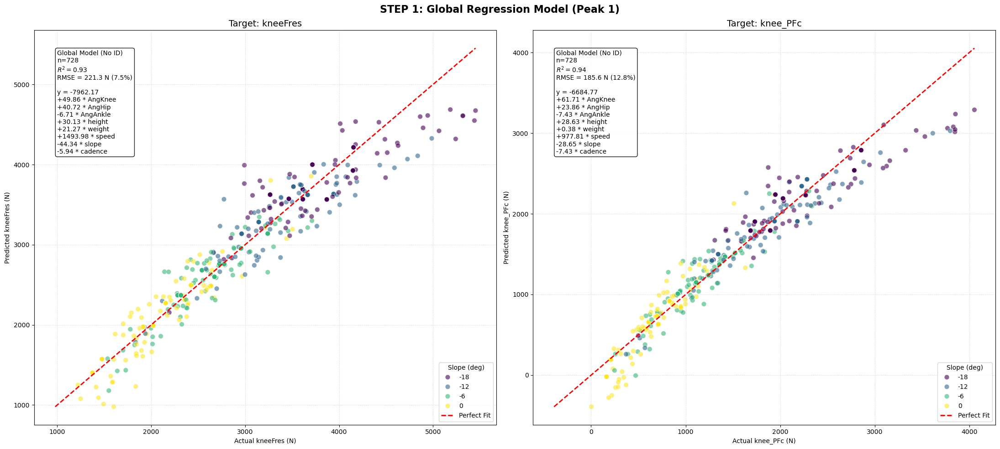


=== GLOBAL REGRESSION RESULTS ===


,Target,R2,RMSE (%),Equation
0,kneeFres,0.926273,7.47%,y = -7962.17 +49.86 * AngKnee +40.72 * AngHip -6.71 * AngAnkle +30.13 * height +21.27 * weight +1493.98 * speed -44.34 * slope -5.94 * cadence
1,knee_PFc,0.940464,12.82%,y = -6684.77 +61.71 * AngKnee +23.86 * AngHip -7.43 * AngAnkle +28.63 * height +0.38 * weight +977.81 * speed -28.65 * slope -7.43 * cadence


In [12]:
# ==============================================================================
# --- 1. SETUP PARAMETERS (GLOBAL REGRESSION - PEAK 1) ---
# ==============================================================================
targets = ['kneeFres', 'knee_PFc'] 
event_type = 'First_Peak_GRF' # <--- PEAK 1 (Impact)

# Liste des variables (Sans l'ID sujet)
global_features = ['angleKnee', 'angleHip', 'angleAnkle', 'height', 'weight', 'speed', 'slope', 'cadence']

# --- PREPARE DATA ---
# 1. Combine datasets
df_self_selected['Condition'] = 'Self-selected'
df_constant['Condition'] = 'Constant'
df_global = pd.concat([df_self_selected, df_constant], ignore_index=True)

# 2. Filter for Peak 1
df_global = df_global[df_global['Event_Type'] == event_type].copy()

# 3. Handle IDs
df_global['id'] = df_global['id'].astype(str).str.strip()

print(f"--- GLOBAL REGRESSION ANALYSIS (PEAK 1) ---")
print(f"Total samples: {len(df_global)}")

# ==============================================================================
# --- 2. MAIN ANALYSIS LOOP ---
# ==============================================================================
results_global = []
fig, axes = plt.subplots(1, 2, figsize=(22, 10)) 
fig.suptitle(f"STEP 1: Global Regression Model (Peak 1)", 
             fontsize=16, fontweight='bold')

for i, target in enumerate(targets):
    ax = axes[i]
    
    # A. Data Cleaning
    cols_needed = global_features + [target] 
    data_clean = df_global.dropna(subset=cols_needed).copy()
    
    # B. Define X and y
    X = data_clean[global_features]
    y = data_clean[target]
    
    # C. Model Fitting
    model = LinearRegression()
    model.fit(X, y)
    y_pred = model.predict(X)
    
    # D. Statistics
    r2 = r2_score(y, y_pred)
    rmse = np.sqrt(mean_squared_error(y, y_pred)) # RMSE absolu (N)
    
    # --- CALCUL DU RMSE EN POURCENTAGE ---
    mean_val = np.mean(y)
    rmse_pct = (rmse / mean_val) * 100 
    # -------------------------------------
    
    # --- E. CONSTRUCT EQUATION STRING ---
    eq_str = f"y = {model.intercept_:.2f}"
    for name, coef in zip(X.columns, model.coef_):
        clean_name = name.replace("angle", "Ang")
        eq_str += f"\n{coef:+.2f} * {clean_name}"
            
    # --- SAVE RESULTS ---
    eq_str_table = eq_str.replace('\n', ' ')
    
    results_global.append({
        'Target': target, 
        'R2': r2, 
        # 'RMSE (N)': rmse,  <-- SUPPRIMÉ DU TABLEAU
        'RMSE (%)': rmse_pct, 
        'Equation': eq_str_table
    })

    # F. VISUALIZATION
    
    # 1. Plot Points
    sns.scatterplot(
        x=y, y=y_pred, 
        hue=data_clean['slope'], palette='viridis', 
        s=60, alpha=0.6, ax=ax
    )
    
    # 2. Perfect Fit Line
    min_val = min(y.min(), y_pred.min())
    max_val = max(y.max(), y_pred.max())
    ax.plot([min_val, max_val], [min_val, max_val], color='red', linestyle='--', linewidth=2, label='Perfect Fit')
    
    # 3. Stats Box (On affiche quand même les N et % sur le graphe pour être complet)
    text_str = (f"Global Model (No ID)\n"
                f"n={len(data_clean)}\n"
                f"$R^2 = {r2:.2f}$\n"
                f"RMSE = {rmse:.1f} N ({rmse_pct:.1f}%)\n\n"
                f"{eq_str}")
    
    props = dict(boxstyle='round', facecolor='white', alpha=0.9, edgecolor='black')
    ax.text(0.05, 0.95, text_str, transform=ax.transAxes, fontsize=10, verticalalignment='top', bbox=props)
    
    ax.set_title(f"Target: {target}", fontsize=14)
    ax.set_xlabel(f"Actual {target} (N)")
    ax.set_ylabel(f"Predicted {target} (N)")
    ax.legend(title='Slope (deg)', loc='lower right')
    ax.grid(True, linestyle=':', alpha=0.6)

plt.tight_layout()
plt.show()

# --- PRINT SUMMARY TABLE ---
print("\n=== GLOBAL REGRESSION RESULTS ===")
summary_df = pd.DataFrame(results_global)

# Formatage
summary_df['RMSE (%)'] = summary_df['RMSE (%)'].map('{:.2f}%'.format)

pd.set_option('display.max_colwidth', None) 
display(summary_df)

* Peak 2

--- GLOBAL REGRESSION ANALYSIS (PEAK 2) ---
Total samples: 728


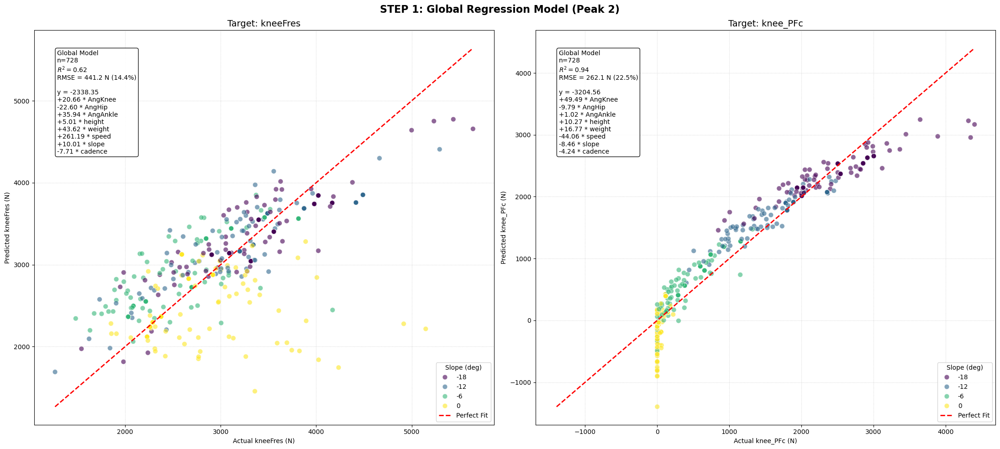


=== GLOBAL REGRESSION RESULTS PEAK 2 ===


,Target,R2,RMSE (%),Equation
0,kneeFres,0.619925,14.42%,y = -2338.35 +20.66 * AngKnee -22.60 * AngHip +35.94 * AngAnkle +5.01 * height +43.62 * weight +261.19 * speed +10.01 * slope -7.71 * cadence
1,knee_PFc,0.938236,22.50%,y = -3204.56 +49.49 * AngKnee -9.79 * AngHip +1.02 * AngAnkle +10.27 * height +16.77 * weight -44.06 * speed -8.46 * slope -4.24 * cadence


In [13]:
# ==============================================================================
# --- 1. SETUP PARAMETERS (GLOBAL REGRESSION - PEAK 2) ---
# ==============================================================================
targets = ['kneeFres', 'knee_PFc'] 
event_type = 'Second_Peak_GRF' # <--- PEAK 2 (Propulsion)

# Liste des variables (Sans l'ID sujet)
global_features = ['angleKnee', 'angleHip', 'angleAnkle', 'height', 'weight', 'speed', 'slope', 'cadence']

# --- PREPARE DATA ---
# 1. Combine datasets (Peak 2)
# On s'assure d'utiliser les dataframes spécifiques au Peak 2
df_peak2_self_selected['Condition'] = 'Self-selected'
df_peak2_constant['Condition'] = 'Constant'
df_global_p2 = pd.concat([df_peak2_self_selected, df_peak2_constant], ignore_index=True)

# 2. Filter for Peak 2
df_global_p2 = df_global_p2[df_global_p2['Event_Type'] == event_type].copy()

# 3. Handle IDs
df_global_p2['id'] = df_global_p2['id'].astype(str).str.strip()

print(f"--- GLOBAL REGRESSION ANALYSIS (PEAK 2) ---")
print(f"Total samples: {len(df_global_p2)}")

# ==============================================================================
# --- 2. MAIN ANALYSIS LOOP ---
# ==============================================================================
results_global_p2 = []
fig, axes = plt.subplots(1, 2, figsize=(22, 10)) 
fig.suptitle(f"STEP 1: Global Regression Model (Peak 2)", 
             fontsize=16, fontweight='bold')

for i, target in enumerate(targets):
    ax = axes[i]
    
    # A. Data Cleaning
    cols_needed = global_features + [target] 
    data_clean = df_global_p2.dropna(subset=cols_needed).copy()
    
    # B. Define X and y
    X = data_clean[global_features]
    y = data_clean[target]
    
    # C. Model Fitting
    model = LinearRegression()
    model.fit(X, y)
    y_pred = model.predict(X)
    
    # D. Statistics
    r2 = r2_score(y, y_pred)
    rmse = np.sqrt(mean_squared_error(y, y_pred)) # RMSE absolu (N)
    
    # --- CALCUL DU RMSE EN POURCENTAGE ---
    mean_val = np.mean(y)
    rmse_pct = (rmse / mean_val) * 100 
    # -------------------------------------
    
    # --- E. CONSTRUCT EQUATION STRING ---
    eq_str = f"y = {model.intercept_:.2f}"
    for name, coef in zip(X.columns, model.coef_):
        clean_name = name.replace("angle", "Ang")
        eq_str += f"\n{coef:+.2f} * {clean_name}"
            
    # --- SAVE RESULTS ---
    eq_str_table = eq_str.replace('\n', ' ')
    
    results_global_p2.append({
        'Target': target, 
        'R2': r2, 
        # 'RMSE (N)': rmse,  <-- SUPPRIMÉ DU TABLEAU FINAL
        'RMSE (%)': rmse_pct, 
        'Equation': eq_str_table
    })

    # F. VISUALIZATION
    
    # 1. Plot Points
    sns.scatterplot(
        x=y, y=y_pred, 
        hue=data_clean['slope'], palette='viridis', 
        s=60, alpha=0.6, ax=ax
    )
    
    # 2. Perfect Fit Line
    min_val = min(y.min(), y_pred.min())
    max_val = max(y.max(), y_pred.max())
    ax.plot([min_val, max_val], [min_val, max_val], color='red', linestyle='--', linewidth=2, label='Perfect Fit')
    
    # 3. Stats Box (Affiche RMSE N et %)
    text_str = (f"Global Model\n"
                f"n={len(data_clean)}\n"
                f"$R^2 = {r2:.2f}$\n"
                f"RMSE = {rmse:.1f} N ({rmse_pct:.1f}%)\n\n"
                f"{eq_str}")
    
    props = dict(boxstyle='round', facecolor='white', alpha=0.9, edgecolor='black')
    ax.text(0.05, 0.95, text_str, transform=ax.transAxes, fontsize=10, verticalalignment='top', bbox=props)
    
    ax.set_title(f"Target: {target}", fontsize=14)
    ax.set_xlabel(f"Actual {target} (N)")
    ax.set_ylabel(f"Predicted {target} (N)")
    ax.legend(title='Slope (deg)', loc='lower right')
    ax.grid(True, linestyle=':', alpha=0.6)

plt.tight_layout()
plt.show()

# --- PRINT SUMMARY TABLE ---
print("\n=== GLOBAL REGRESSION RESULTS PEAK 2 ===")
summary_df_p2 = pd.DataFrame(results_global_p2)

# Formatage
summary_df_p2['RMSE (%)'] = summary_df_p2['RMSE (%)'].map('{:.2f}%'.format)

pd.set_option('display.max_colwidth', None) 
display(summary_df_p2)

## Include participant identity as a covariate to account for inter-subject variability

* Peak 1

--- GLOBAL REGRESSION ANALYSIS (PEAK 1) WITH SUBJECT IDs ---
Total samples: 728


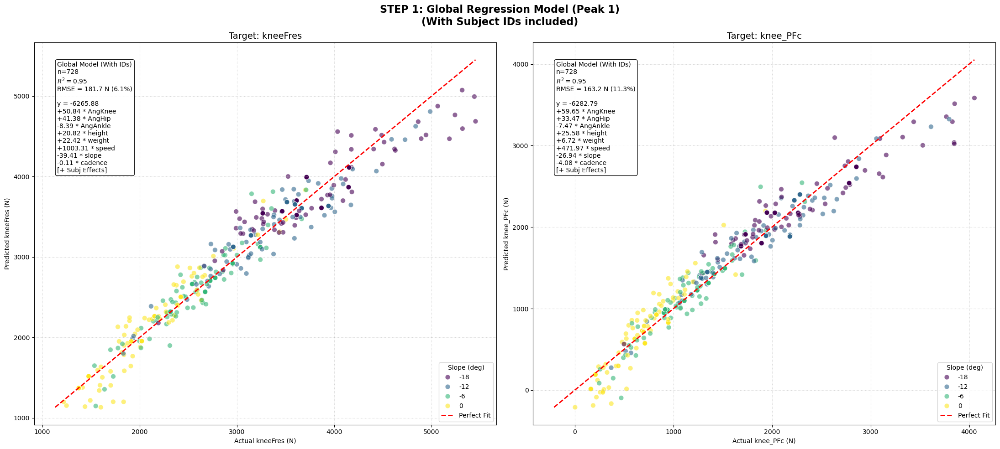


=== GLOBAL REGRESSION RESULTS (WITH SUBJECT ID) ===


,Target,R2,RMSE (%),Equation
0,kneeFres,0.950329,6.13%,y = -6265.88 +50.84 * AngKnee +41.38 * AngHip -8.39 * AngAnkle +20.82 * height +22.42 * weight +1003.31 * speed -39.41 * slope -0.11 * cadence [+ Subj Effects]
1,knee_PFc,0.953988,11.27%,y = -6282.79 +59.65 * AngKnee +33.47 * AngHip -7.47 * AngAnkle +25.58 * height +6.72 * weight +471.97 * speed -26.94 * slope -4.08 * cadence [+ Subj Effects]


In [14]:
# ==============================================================================
# --- 1. SETUP PARAMETERS (GLOBAL REGRESSION - PEAK 1) ---
# ==============================================================================
targets = ['kneeFres', 'knee_PFc'] 
event_type = 'First_Peak_GRF' # <--- PEAK 1 (Impact)

# We include 'slope' as a predictor here
global_features = ['angleKnee', 'angleHip', 'angleAnkle', 'height', 'weight', 'speed', 'slope', 'cadence']

# --- PREPARE DATA ---
# 1. Combine datasets
df_self_selected['Condition'] = 'Self-selected'
df_constant['Condition'] = 'Constant'
df_global = pd.concat([df_self_selected, df_constant], ignore_index=True)

# 2. Filter for Peak 1
df_global = df_global[df_global['Event_Type'] == event_type].copy()

# 3. Handle IDs
df_global['id'] = df_global['id'].astype(str).str.strip()

print(f"--- GLOBAL REGRESSION ANALYSIS (PEAK 1) WITH SUBJECT IDs ---")
print(f"Total samples: {len(df_global)}")

# ==============================================================================
# --- 2. MAIN ANALYSIS LOOP ---
# ==============================================================================
results_global = []
fig, axes = plt.subplots(1, 2, figsize=(22, 10)) 
fig.suptitle(f"STEP 1: Global Regression Model (Peak 1)\n(With Subject IDs included)", 
             fontsize=16, fontweight='bold')

for i, target in enumerate(targets):
    ax = axes[i]
    
    # A. Data Cleaning
    cols_needed = global_features + [target, 'id']
    data_clean = df_global.dropna(subset=cols_needed).copy()
    
    # B. Feature Engineering (Subject Dummies)
    participant_dummies = pd.get_dummies(data_clean['id'], prefix='Subj', drop_first=True)
    
    # X includes Features + Slope + Subjects
    X = pd.concat([data_clean[global_features], participant_dummies], axis=1)
    y = data_clean[target]
    
    # C. Model Fitting
    model = LinearRegression()
    model.fit(X, y)
    y_pred = model.predict(X)
    
    # D. Statistics
    r2 = r2_score(y, y_pred)
    rmse = np.sqrt(mean_squared_error(y, y_pred)) # RMSE Absolu (N)
    
    # --- CALCUL DU RMSE EN POURCENTAGE ---
    mean_val = np.mean(y)
    rmse_pct = (rmse / mean_val) * 100 
    # -------------------------------------
    
    # --- E. CONSTRUCT EQUATION STRING ---
    eq_str = f"y = {model.intercept_:.2f}"
    
    for name, coef in zip(X.columns, model.coef_):
        if 'Subj' not in name:
            clean_name = name.replace("angle", "Ang")
            eq_str += f"\n{coef:+.2f} * {clean_name}"
            
    eq_str += "\n[+ Subj Effects]" 
    
    # --- SAVE RESULTS ---
    eq_str_table = eq_str.replace('\n', ' ')
    
    results_global.append({
        'Target': target, 
        'R2': r2, 
        # 'RMSE (N)': rmse,  <-- SUPPRIMÉ DU TABLEAU FINAL
        'RMSE (%)': rmse_pct, 
        'Equation': eq_str_table
    })

    # F. VISUALIZATION
    
    # 1. Plot Points (Colored by Slope)
    sns.scatterplot(
        x=y, y=y_pred, 
        hue=data_clean['slope'], palette='viridis', 
        s=60, alpha=0.6, ax=ax
    )
    
    # 2. Perfect Fit Line
    min_val = min(y.min(), y_pred.min())
    max_val = max(y.max(), y_pred.max())
    ax.plot([min_val, max_val], [min_val, max_val], color='red', linestyle='--', linewidth=2, label='Perfect Fit')
    
    # 3. Stats Box WITH RMSE%
    text_str = (f"Global Model (With IDs)\n"
                f"n={len(data_clean)}\n"
                f"$R^2 = {r2:.2f}$\n"
                f"RMSE = {rmse:.1f} N ({rmse_pct:.1f}%)\n\n"
                f"{eq_str}")
    
    props = dict(boxstyle='round', facecolor='white', alpha=0.9, edgecolor='black')
    ax.text(0.05, 0.95, text_str, transform=ax.transAxes, fontsize=10, verticalalignment='top', bbox=props)
    
    ax.set_title(f"Target: {target}", fontsize=14)
    ax.set_xlabel(f"Actual {target} (N)")
    ax.set_ylabel(f"Predicted {target} (N)")
    ax.legend(title='Slope (deg)', loc='lower right')
    ax.grid(True, linestyle=':', alpha=0.6)

plt.tight_layout()
plt.show()

# --- PRINT SUMMARY TABLE ---
print("\n=== GLOBAL REGRESSION RESULTS (WITH SUBJECT ID) ===")
summary_df = pd.DataFrame(results_global)

# Formatage
summary_df['RMSE (%)'] = summary_df['RMSE (%)'].map('{:.2f}%'.format)

pd.set_option('display.max_colwidth', None) 
display(summary_df)

* Peak 2

--- GLOBAL REGRESSION ANALYSIS (PEAK 2) WITH SUBJECT IDs ---
Total samples: 728


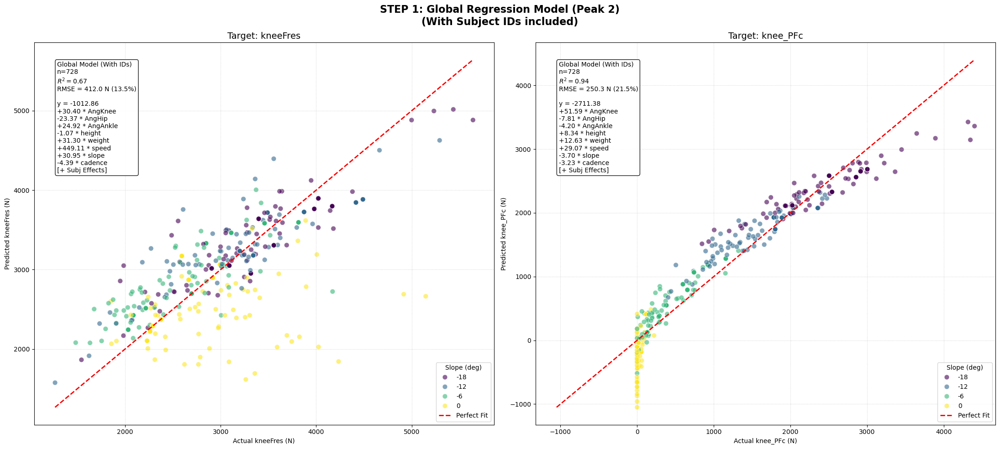


=== GLOBAL REGRESSION RESULTS (PEAK 2 - WITH SUBJECT ID) ===


,Target,R2,RMSE (%),Equation
0,kneeFres,0.668567,13.47%,y = -1012.86 +30.40 * AngKnee -23.37 * AngHip +24.92 * AngAnkle -1.07 * height +31.30 * weight +449.11 * speed +30.95 * slope -4.39 * cadence [+ Subj Effects]
1,knee_PFc,0.943654,21.49%,y = -2711.38 +51.59 * AngKnee -7.81 * AngHip -4.20 * AngAnkle +8.34 * height +12.63 * weight +29.07 * speed -3.70 * slope -3.23 * cadence [+ Subj Effects]


In [15]:
# ==============================================================================
# --- 1. SETUP PARAMETERS (GLOBAL REGRESSION - PEAK 2) ---
# ==============================================================================
targets = ['kneeFres', 'knee_PFc'] 
event_type = 'Second_Peak_GRF' # <--- PEAK 2

# We include 'slope' as a predictor here
global_features = ['angleKnee', 'angleHip', 'angleAnkle', 'height', 'weight', 'speed', 'slope', 'cadence']

# --- PREPARE DATA ---
# 1. Combine datasets (Peak 2 Dataframes)
df_peak2_self_selected['Condition'] = 'Self-selected'
df_peak2_constant['Condition'] = 'Constant'

# On combine les deux datasets du PEAK 2
df_global_p2 = pd.concat([df_peak2_self_selected, df_peak2_constant], ignore_index=True)

# 2. Filter for Peak 2 Event
df_global_p2 = df_global_p2[df_global_p2['Event_Type'] == event_type].copy()

# 3. Handle IDs
df_global_p2['id'] = df_global_p2['id'].astype(str).str.strip()

print(f"--- GLOBAL REGRESSION ANALYSIS (PEAK 2) WITH SUBJECT IDs ---")
print(f"Total samples: {len(df_global_p2)}")

# ==============================================================================
# --- 2. MAIN ANALYSIS LOOP ---
# ==============================================================================
results_global_p2 = []
fig, axes = plt.subplots(1, 2, figsize=(22, 10)) 
fig.suptitle(f"STEP 1: Global Regression Model (Peak 2)\n(With Subject IDs included)", 
             fontsize=16, fontweight='bold')

for i, target in enumerate(targets):
    ax = axes[i]
    
    # A. Data Cleaning
    cols_needed = global_features + [target, 'id']
    data_clean = df_global_p2.dropna(subset=cols_needed).copy()
    
    # B. Feature Engineering (Subject Dummies)
    participant_dummies = pd.get_dummies(data_clean['id'], prefix='Subj', drop_first=True)
    
    # X includes Features + Slope + Subjects
    X = pd.concat([data_clean[global_features], participant_dummies], axis=1)
    y = data_clean[target]
    
    # C. Model Fitting
    model = LinearRegression()
    model.fit(X, y)
    y_pred = model.predict(X)
    
    # D. Statistics
    r2 = r2_score(y, y_pred)
    rmse = np.sqrt(mean_squared_error(y, y_pred)) # RMSE Absolu (N)

    # --- CALCUL DU RMSE EN POURCENTAGE ---
    mean_val = np.mean(y)
    rmse_pct = (rmse / mean_val) * 100 
    # -------------------------------------
    
    # --- E. CONSTRUCT EQUATION STRING ---
    eq_str = f"y = {model.intercept_:.2f}"
    
    for name, coef in zip(X.columns, model.coef_):
        # We hide "Subj_xx" but show biomechanical variables
        if 'Subj' not in name:
            clean_name = name.replace("angle", "Ang")
            eq_str += f"\n{coef:+.2f} * {clean_name}"
            
    eq_str += "\n[+ Subj Effects]" 
    
    # --- SAVE RESULTS ---
    eq_str_table = eq_str.replace('\n', ' ')
    
    results_global_p2.append({
        'Target': target, 
        'R2': r2, 
        # 'RMSE': rmse,  <-- REMOVED FROM TABLE
        'RMSE (%)': rmse_pct, 
        'Equation': eq_str_table
    })

    # F. VISUALIZATION
    
    # 1. Plot Points (Colored by Slope)
    sns.scatterplot(
        x=y, y=y_pred, 
        hue=data_clean['slope'], palette='viridis', 
        s=60, alpha=0.6, ax=ax
    )
    
    # 2. Perfect Fit Line
    min_val = min(y.min(), y_pred.min())
    max_val = max(y.max(), y_pred.max())
    ax.plot([min_val, max_val], [min_val, max_val], color='red', linestyle='--', linewidth=2, label='Perfect Fit')
    
    # 3. Stats Box WITH EQUATION & RMSE%
    text_str = (f"Global Model (With IDs)\n"
                f"n={len(data_clean)}\n"
                f"$R^2 = {r2:.2f}$\n"
                f"RMSE = {rmse:.1f} N ({rmse_pct:.1f}%)\n\n"
                f"{eq_str}")
    
    props = dict(boxstyle='round', facecolor='white', alpha=0.9, edgecolor='black')
    ax.text(0.05, 0.95, text_str, transform=ax.transAxes, fontsize=10, verticalalignment='top', bbox=props)
    
    ax.set_title(f"Target: {target}", fontsize=14)
    ax.set_xlabel(f"Actual {target} (N)")
    ax.set_ylabel(f"Predicted {target} (N)")
    ax.legend(title='Slope (deg)', loc='lower right')
    ax.grid(True, linestyle=':', alpha=0.6)

plt.tight_layout()
plt.show()

# --- PRINT SUMMARY TABLE ---
print("\n=== GLOBAL REGRESSION RESULTS (PEAK 2 - WITH SUBJECT ID) ===")
summary_df_p2 = pd.DataFrame(results_global_p2)

# Formatage
summary_df_p2['RMSE (%)'] = summary_df_p2['RMSE (%)'].map('{:.2f}%'.format)

pd.set_option('display.max_colwidth', None) 
display(summary_df_p2)

# II. Feature selection

--> See "Linear_Regression_VF4_EN_14_01_2"

In [16]:
import pandas as pd
import numpy as np
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score, mean_squared_error

# ==============================================================================
# --- 1. SETUP & DATA PREPARATION ---
# ==============================================================================

# --- A. Define Variable Scenarios (ORDERED AS REQUESTED) ---
all_vars = ['angleKnee', 'angleHip', 'angleAnkle', 'height', 'weight', 'speed', 'slope', 'cadence']

# We use a dictionary to define the sets. The order here determines the table order.
model_scenarios = {
    "1. No Cadence": [v for v in all_vars if v not in ['cadence']],
    "2. No Cadence & Ankle": [v for v in all_vars if v not in ['cadence', 'angleAnkle']],
    "3. No Slope": [v for v in all_vars if v not in ['slope']],
    "4. No Slope & Cadence": [v for v in all_vars if v not in ['slope', 'cadence']],
    "5. All var": all_vars, # Useful to compare if we lost precision
}

# --- B. Prepare Datasets (Peak 1 & Peak 2) ---
# Combine and label datasets
df_self_selected['Condition'] = 'Self-selected'
df_constant['Condition'] = 'Constant'
df_peak2_self_selected['Condition'] = 'Self-selected'
df_peak2_constant['Condition'] = 'Constant'

# Create Global Dataframes
df_p1 = pd.concat([df_self_selected, df_constant], ignore_index=True)
df_p1 = df_p1[df_p1['Event_Type'] == 'First_Peak_GRF'].copy()

df_p2 = pd.concat([df_peak2_self_selected, df_peak2_constant], ignore_index=True)
df_p2 = df_p2[df_p2['Event_Type'] == 'Second_Peak_GRF'].copy()


# Prepare a list to loop through both peaks
datasets = [
    ("Peak 1", df_p1),
    ("Peak 2", df_p2)
]

targets = ['kneeFres', 'knee_PFc']
results_selection = []

print("--- STARTING FEATURE SELECTION ANALYSIS ---")

# ==============================================================================
# --- 2. MAIN ANALYSIS LOOP ---
# ==============================================================================

for peak_name, df_raw in datasets:
    
    # 1. Clean IDs and Exclude Participants
    df = df_raw.copy()
    df['id'] = df['id'].astype(str).str.strip()
    
    for target in targets:
        
        # Loop through each scenario
        for scenario_name, features in model_scenarios.items():
            
            # A. Data Cleaning for this specific set of features
            cols_needed = features + [target, 'id']
            data_clean = df.dropna(subset=cols_needed).copy()
            
            if len(data_clean) == 0:
                continue
            
            # B. Prepare X and y
            # We ALWAYS include Subject IDs to control for inter-subject variability
            participant_dummies = pd.get_dummies(data_clean['id'], prefix='Subj', drop_first=True)
            X = pd.concat([data_clean[features], participant_dummies], axis=1)
            y = data_clean[target]
            
            # C. Fit Model
            model = LinearRegression()
            model.fit(X, y)
            y_pred = model.predict(X)
            
            # D. Statistics
            r2 = r2_score(y, y_pred)
            rmse = np.sqrt(mean_squared_error(y, y_pred))
            
            # Calculate RMSE % (NRMSE)
            mean_y = np.mean(y)
            rmse_pct = (rmse / mean_y) * 100
            
            # E. Store Results
            results_selection.append({
                'Peak': peak_name,
                'Target': target,
                'Scenario': scenario_name,
                'Variables Used': ", ".join(features),
                'R2': r2,
                'RMSE (%)': rmse_pct
            })

# ==============================================================================
# --- 3. SUMMARY TABLE ---
# ==============================================================================
df_results = pd.DataFrame(results_selection)

# Formatting for display
df_results['R2'] = df_results['R2'].map('{:.3f}'.format)
df_results['RMSE (%)'] = df_results['RMSE (%)'].map('{:.2f}%'.format)

# Organize columns
cols_order = ['Peak', 'Target', 'Scenario', 'R2', 'RMSE (%)', 'Variables Used']
df_results = df_results[cols_order]

print("\n=== PART II: FEATURE SELECTION SUMMARY ===")
pd.set_option('display.max_colwidth', None)
display(df_results)

--- STARTING FEATURE SELECTION ANALYSIS ---

=== PART II: FEATURE SELECTION SUMMARY ===


,Peak,Target,Scenario,R2,RMSE (%),Variables Used
0,Peak 1,kneeFres,1. No Cadence,0.950,6.13%,"angleKnee, angleHip, angleAnkle, height, weight, speed, slope"
1,Peak 1,kneeFres,2. No Cadence & Ankle,0.950,6.15%,"angleKnee, angleHip, height, weight, speed, slope"
2,Peak 1,kneeFres,3. No Slope,0.944,6.50%,"angleKnee, angleHip, angleAnkle, height, weight, speed, cadence"
3,Peak 1,kneeFres,4. No Slope & Cadence,0.944,6.54%,"angleKnee, angleHip, angleAnkle, height, weight, speed"
4,Peak 1,kneeFres,5. All var,0.950,6.13%,"angleKnee, angleHip, angleAnkle, height, weight, speed, slope, cadence"
5,Peak 1,knee_PFc,1. No Cadence,0.954,11.33%,"angleKnee, angleHip, angleAnkle, height, weight, speed, slope"
6,Peak 1,knee_PFc,2. No Cadence & Ankle,0.953,11.37%,"angleKnee, angleHip, height, weight, speed, slope"
7,Peak 1,knee_PFc,3. No Slope,0.951,11.67%,"angleKnee, angleHip, angleAnkle, height, weight, speed, cadence"
8,Peak 1,knee_PFc,4. No Slope & Cadence,0.951,11.67%,"angleKnee, angleHip, angleAnkle, height, weight, speed"
9,Peak 1,knee_PFc,5. All var,0.954,11.27%,"angleKnee, angleHip, angleAnkle, height, weight, speed, slope, cadence"


Variables selected : angleKnee, angleHip, angleAnkle, height, weight, speed, slope

# III. Without outliers

* Analysis for peak 1

--- VISUAL INSPECTION OF OUTLIERS ---
Number of participants: 18


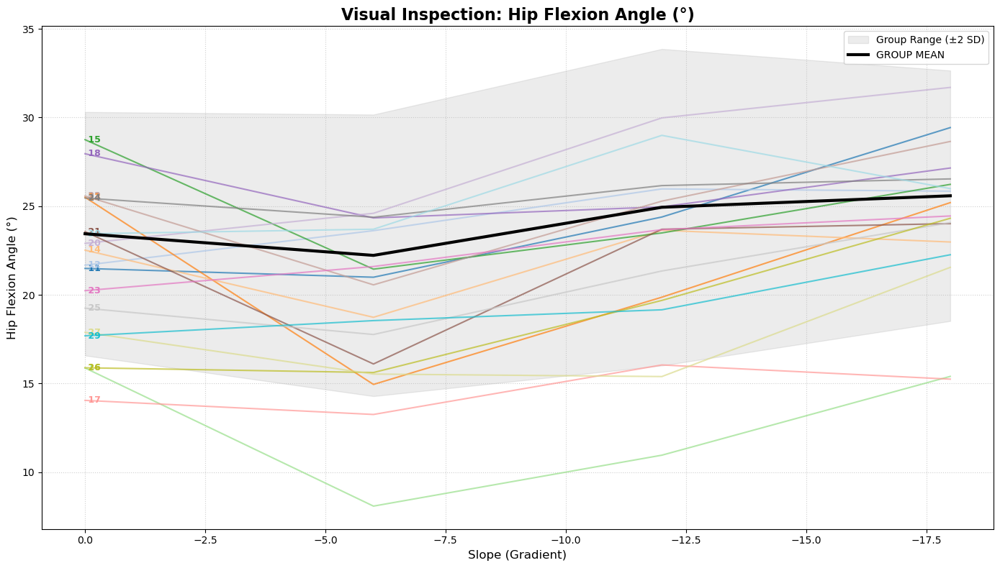

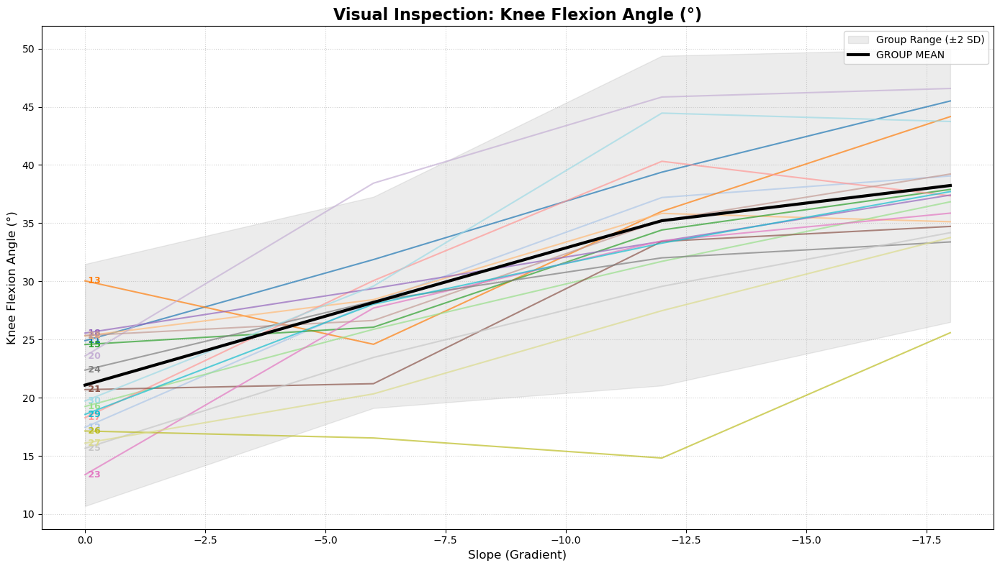

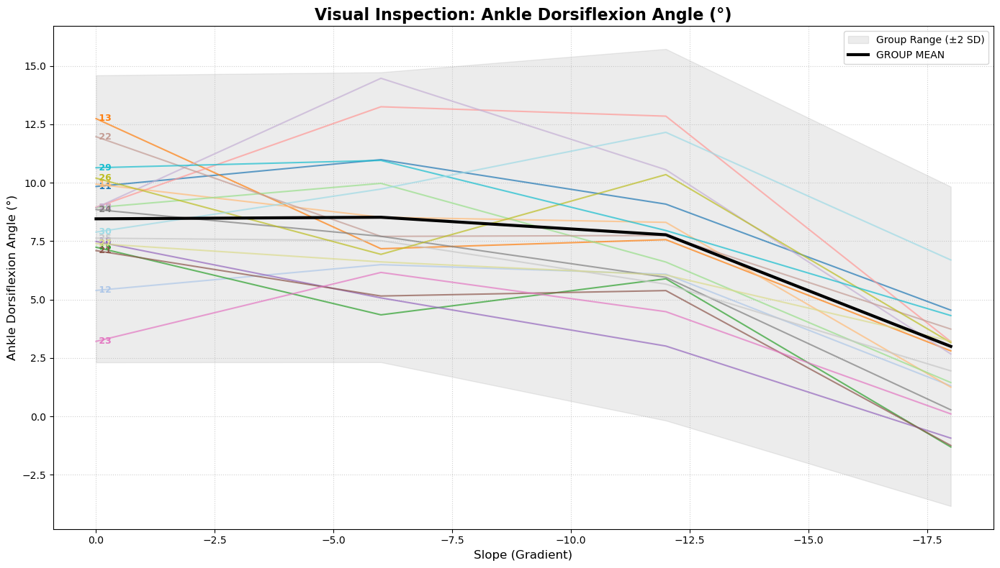

In [17]:
# 1. Setup Data
# Combine datasets to get a comprehensive view
df_self_selected['Condition'] = 'Self-selected'
df_constant['Condition'] = 'Constant'
df_all = pd.concat([df_self_selected, df_constant], ignore_index=True)

# Filter for Peak 1 (Impact) for kinematic analysis
df_all = df_all[df_all['Event_Type'] == 'First_Peak_GRF'].copy()

# Clean IDs (ensure they are strings and stripped of whitespace)
df_all['id'] = df_all['id'].astype(str).str.strip()

# Variables to analyze
angle_cols = ["angleHip", "angleKnee", "angleAnkle"]
label_map = {
    "angleHip": "Hip Flexion Angle (°)", 
    "angleKnee": "Knee Flexion Angle (°)", 
    "angleAnkle": "Ankle Dorsiflexion Angle (°)"
}

# --- Helper Function to handle list-type data ---
def get_mean_from_list(val):
    if isinstance(val, (list, np.ndarray)):
        return np.mean(val)
    return val

# Apply the function
for col in angle_cols:
    df_all[col] = df_all[col].apply(get_mean_from_list)

# 2. Calculate Group Statistics (Across ALL participants)
# We calculate the Mean and Standard Deviation for the whole group
group_stats = df_all.groupby('slope')[angle_cols].agg(['mean', 'std'])

print(f"--- VISUAL INSPECTION OF OUTLIERS ---")
print(f"Number of participants: {df_all['id'].nunique()}")

# 3. Create Plots
# Use a distinct color palette to distinguish lines
unique_ids = sorted(df_all['id'].unique())
colors = plt.cm.tab20(np.linspace(0, 1, len(unique_ids))) # Varied palette
color_map = dict(zip(unique_ids, colors))

for col in angle_cols:
    plt.figure(figsize=(14, 8))
    
    # A. Plot the "Normal Band" (Mean +/- 2 SD)
    m = group_stats[col]['mean']
    s = group_stats[col]['std']
    
    plt.fill_between(m.index, m - 2*s, m + 2*s, color='gray', alpha=0.15, label='Group Range (±2 SD)')
    plt.plot(m.index, m.values, color='black', linewidth=3, linestyle='-', label='GROUP MEAN', zorder=5)

    # B. Plot Every Participant
    for pid in unique_ids:
        # Data for this subject
        subject_data = df_all[df_all['id'] == pid].groupby('slope')[col].mean()
        
        # Specific color for the participant
        c = color_map[pid]
        
        # Plot the line
        line, = plt.plot(subject_data.index, subject_data.values, 
                         color=c, alpha=0.7, linewidth=1.5, zorder=3)
        
        # Add Label (ID) at the end of the line
        # Slightly offset text for readability
        if len(subject_data) > 0:
            y_pos = subject_data.values[-1]
            x_pos = subject_data.index[-1]
            
            plt.text(x_pos, y_pos, f' {pid}', 
                     fontsize=9, color=c, fontweight='bold', va='center')

    # C. Formatting
    var_name = label_map.get(col, col)
    plt.title(f'Visual Inspection: {var_name}', fontsize=16, fontweight='bold')
    plt.xlabel('Slope (Gradient)', fontsize=12)
    plt.ylabel(var_name, fontsize=12)
    
    plt.legend(loc='upper right')
    plt.grid(True, linestyle=':', alpha=0.6)
    plt.gca().invert_xaxis() # To have 0 on the left and -18 on the right (intuitive for descent)
    
    plt.tight_layout()
    plt.show()

In [18]:
# ==============================================================================
# --- 4. AUTOMATIC OUTLIER RECOMMENDATION (Z-SCORE ANALYSIS) ---
# ==============================================================================

print("\n" + "="*50)
print("--- AUTOMATIC OUTLIER DETECTION REPORT ---")
print("Criterion: Values outside Mean ± 2 Standard Deviations")
print("="*50)

outlier_report = []

# Loop through each participant to check their "distance" from the group
for pid in unique_ids:
    # Filter data for this participant
    subject_data = df_all[df_all['id'] == pid]
    
    flag_count = 0
    deviations = []
    
    # Check every slope available for this participant
    for slope in subject_data['slope'].unique():
        # Skip if we don't have group stats for this slope
        if slope not in group_stats.index: continue
        
        for col in angle_cols:
            # 1. Get Subject Value (Mean for this slope)
            val = subject_data[subject_data['slope'] == slope][col].mean()
            
            # 2. Get Group Stats
            mean_g = group_stats.loc[slope, (col, 'mean')]
            std_g = group_stats.loc[slope, (col, 'std')]
            
            # 3. Calculate Z-Score (How many SDs away?)
            if std_g > 0:
                z_score = (val - mean_g) / std_g
            else:
                z_score = 0
            
            # 4. Check Threshold (Abs(Z) > 2 means outside the gray band)
            if abs(z_score) > 2.0:
                flag_count += 1
                # Record the detail (e.g., "Knee at -6°")
                col_short = col.replace("angle", "")
                deviations.append(f"{col_short}@{slope}°(Z={z_score:.1f})")

    # Store results for this participant
    if flag_count > 0:
        outlier_report.append({
            'Participant ID': pid,
            'Total Deviations': flag_count,
            'Variables Affected': ", ".join(deviations)
        })

# --- DISPLAY RESULTS ---
if len(outlier_report) > 0:
    # Create DataFrame and Sort by number of errors
    df_report = pd.DataFrame(outlier_report)
    df_report = df_report.sort_values('Total Deviations', ascending=False).reset_index(drop=True)
    
    print(f"\nFound {len(df_report)} participants with at least one deviation.")
    print("Top candidates for removal are listed first:\n")
    
    # Display styling
    pd.set_option('display.max_colwidth', None)
    display(df_report)
    
    # --- AUTOMATIC RECOMMENDATION TEXT ---
    top_outlier = df_report.iloc[0]
    print("\n--- RECOMMENDATION ---")
    print(f"1. Participant {top_outlier['Participant ID']} is the strongest candidate for removal.")
    print(f"   Reason: They fell outside the normal range {top_outlier['Total Deviations']} times.")
    
    # Check for a second candidate (if gap is small)
    if len(df_report) > 1:
        second_outlier = df_report.iloc[1]
        if second_outlier['Total Deviations'] > 3: # Arbitrary threshold for "serious" outlier
            print(f"2. Participant {second_outlier['Participant ID']} should also be considered.")
            print(f"   Reason: They had {second_outlier['Total Deviations']} deviations.")

else:
    print("\nNo statistical outliers detected. All participants stayed within ±2 SD.")


--- AUTOMATIC OUTLIER DETECTION REPORT ---
Criterion: Values outside Mean ± 2 Standard Deviations

Found 5 participants with at least one deviation.
Top candidates for removal are listed first:



,Participant ID,Total Deviations,Variables Affected
0,16,4,"Hip@-18°(Z=-2.9), Hip@-12°(Z=-3.1), Hip@-6°(Z=-3.6), Hip@0°(Z=-2.2)"
1,26,4,"Knee@-18°(Z=-2.2), Knee@-12°(Z=-2.9), Knee@-6°(Z=-2.6), Hip@0°(Z=-2.2)"
2,17,3,"Hip@-18°(Z=-2.9), Hip@-6°(Z=-2.3), Hip@0°(Z=-2.7)"
3,20,1,Knee@-6°(Z=2.3)
4,27,1,Hip@-12°(Z=-2.1)



--- RECOMMENDATION ---
1. Participant 16 is the strongest candidate for removal.
   Reason: They fell outside the normal range 4 times.
2. Participant 26 should also be considered.
   Reason: They had 4 deviations.


* Analysis for peak 2

--- VISUAL INSPECTION OF OUTLIERS (PEAK 2) ---
Number of participants: 18


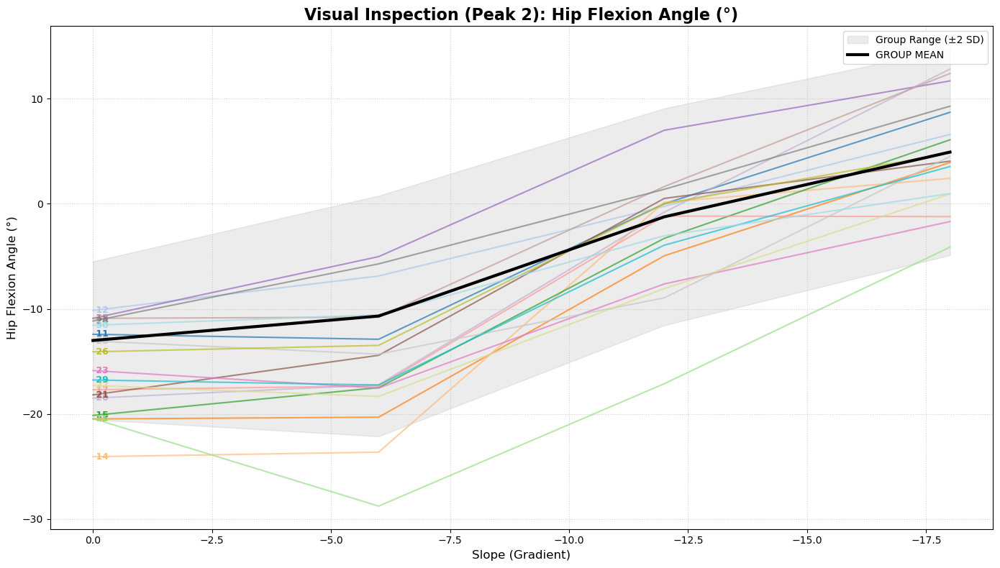

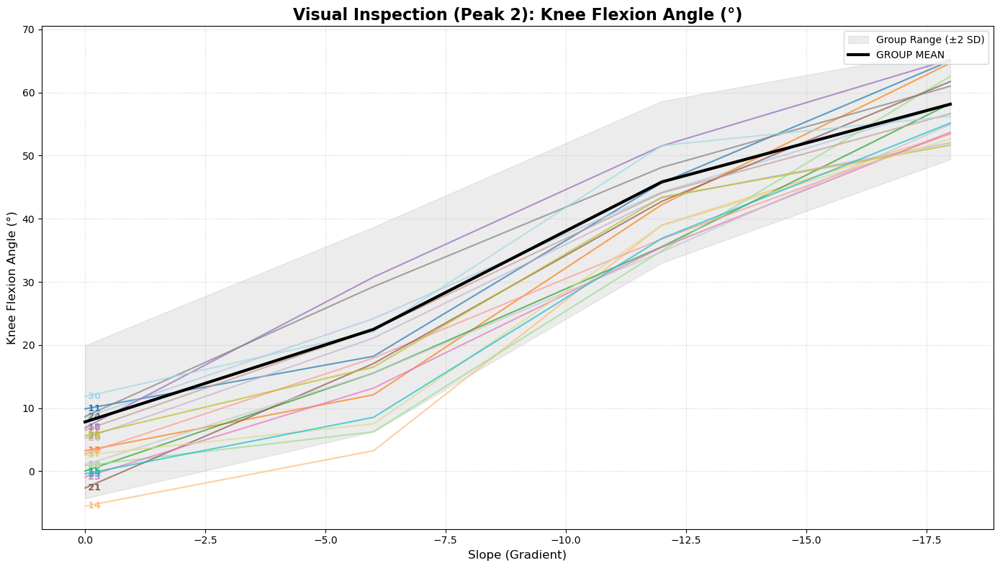

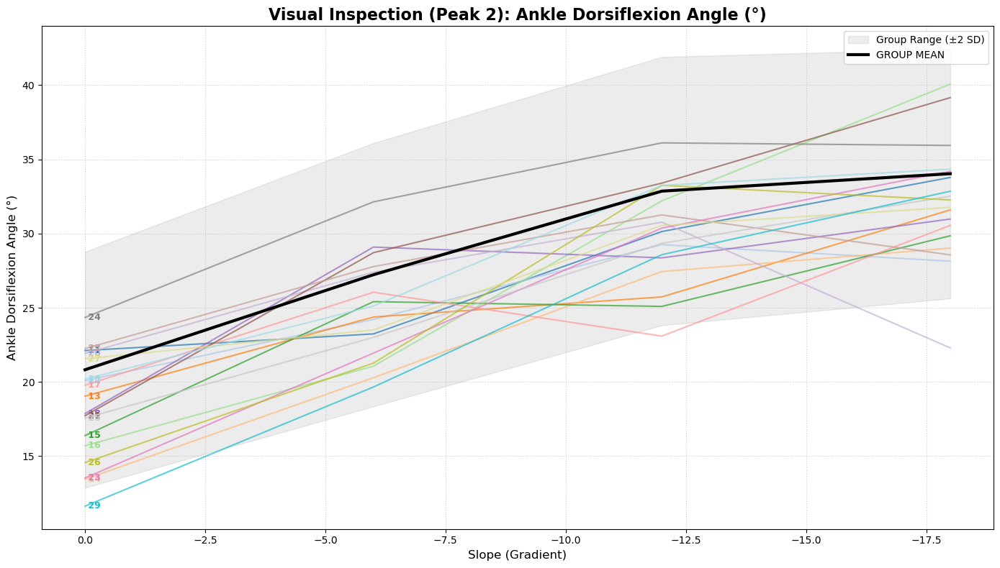

In [19]:
# 1. Setup Data for PEAK 2
# Combine Peak 2 datasets
df_peak2_self_selected['Condition'] = 'Self-selected'
df_peak2_constant['Condition'] = 'Constant'
df_all_p2 = pd.concat([df_peak2_self_selected, df_peak2_constant], ignore_index=True)

# Filter for Peak 2 (Propulsion)
df_all_p2 = df_all_p2[df_all_p2['Event_Type'] == 'Second_Peak_GRF'].copy()

# Clean IDs
df_all_p2['id'] = df_all_p2['id'].astype(str).str.strip()

# Variables to analyze
angle_cols = ["angleHip", "angleKnee", "angleAnkle"]
label_map = {
    "angleHip": "Hip Flexion Angle (°)", 
    "angleKnee": "Knee Flexion Angle (°)", 
    "angleAnkle": "Ankle Dorsiflexion Angle (°)"
}

# --- Helper Function to handle list-type data ---
def get_mean_from_list(val):
    if isinstance(val, (list, np.ndarray)):
        return np.mean(val)
    return val

# Apply the function
for col in angle_cols:
    df_all_p2[col] = df_all_p2[col].apply(get_mean_from_list)

# 2. Calculate Group Statistics (Across ALL participants in Peak 2)
group_stats = df_all_p2.groupby('slope')[angle_cols].agg(['mean', 'std'])

print(f"--- VISUAL INSPECTION OF OUTLIERS (PEAK 2) ---")
print(f"Number of participants: {df_all_p2['id'].nunique()}")

# 3. Create Plots
unique_ids = sorted(df_all_p2['id'].unique())
colors = plt.cm.tab20(np.linspace(0, 1, len(unique_ids))) 
color_map = dict(zip(unique_ids, colors))

for col in angle_cols:
    plt.figure(figsize=(14, 8))
    
    # A. Plot the "Normal Band" (Mean +/- 2 SD)
    m = group_stats[col]['mean']
    s = group_stats[col]['std']
    
    plt.fill_between(m.index, m - 2*s, m + 2*s, color='gray', alpha=0.15, label='Group Range (±2 SD)')
    plt.plot(m.index, m.values, color='black', linewidth=3, linestyle='-', label='GROUP MEAN', zorder=5)

    # B. Plot Every Participant
    for pid in unique_ids:
        # Data for this subject in Peak 2
        subject_data = df_all_p2[df_all_p2['id'] == pid].groupby('slope')[col].mean()
        
        if len(subject_data) == 0:
            continue
            
        # Specific color for the participant
        c = color_map[pid]
        
        # Plot the line
        line, = plt.plot(subject_data.index, subject_data.values, 
                         color=c, alpha=0.7, linewidth=1.5, zorder=3)
        
        # Add Label (ID) at the end of the line
        y_pos = subject_data.values[-1]
        x_pos = subject_data.index[-1]
        
        plt.text(x_pos, y_pos, f' {pid}', 
                 fontsize=9, color=c, fontweight='bold', va='center')

    # C. Formatting
    var_name = label_map.get(col, col)
    plt.title(f'Visual Inspection (Peak 2): {var_name}', fontsize=16, fontweight='bold')
    plt.xlabel('Slope (Gradient)', fontsize=12)
    plt.ylabel(var_name, fontsize=12)
    
    plt.legend(loc='upper right')
    plt.grid(True, linestyle=':', alpha=0.6)
    plt.gca().invert_xaxis() 
    
    plt.tight_layout()
    plt.show()

In [20]:
# ==============================================================================
# --- 4. AUTOMATIC OUTLIER RECOMMENDATION (Z-SCORE ANALYSIS - PEAK 2) ---
# ==============================================================================

print("\n" + "="*50)
print("--- AUTOMATIC OUTLIER DETECTION REPORT (PEAK 2) ---")
print("Criterion: Values outside Mean ± 2 Standard Deviations")
print("="*50)

outlier_report_p2 = []

# Loop through each participant
for pid in unique_ids:
    # Filter data for this participant using the PEAK 2 dataframe
    subject_data = df_all_p2[df_all_p2['id'] == pid]
    
    flag_count = 0
    deviations = []
    
    # Check every slope available for this participant
    for slope in subject_data['slope'].unique():
        # Skip if we don't have group stats for this slope
        if slope not in group_stats.index: continue
        
        for col in angle_cols:
            # 1. Get Subject Value (Mean for this slope)
            val = subject_data[subject_data['slope'] == slope][col].mean()
            
            # 2. Get Group Stats (Calculated on Peak 2 data)
            mean_g = group_stats.loc[slope, (col, 'mean')]
            std_g = group_stats.loc[slope, (col, 'std')]
            
            # 3. Calculate Z-Score
            if std_g > 0:
                z_score = (val - mean_g) / std_g
            else:
                z_score = 0
            
            # 4. Check Threshold (Abs(Z) > 2)
            if abs(z_score) > 2.0:
                flag_count += 1
                col_short = col.replace("angle", "")
                deviations.append(f"{col_short}@{slope}°(Z={z_score:.1f})")

    # Store results
    if flag_count > 0:
        outlier_report_p2.append({
            'Participant ID': pid,
            'Total Deviations': flag_count,
            'Variables Affected': ", ".join(deviations)
        })

# --- DISPLAY RESULTS ---
if len(outlier_report_p2) > 0:
    # Create DataFrame and Sort
    df_report_p2 = pd.DataFrame(outlier_report_p2)
    df_report_p2 = df_report_p2.sort_values('Total Deviations', ascending=False).reset_index(drop=True)
    
    print(f"\nFound {len(df_report_p2)} participants with deviations in Peak 2.")
    print("Top candidates for removal:\n")
    
    pd.set_option('display.max_colwidth', None)
    display(df_report_p2)
    
    # --- AUTOMATIC ADVICE ---
    top_outlier = df_report_p2.iloc[0]
    print("\n--- ANALYSIS ADVICE (PEAK 2) ---")
    print(f"Check if Participant {top_outlier['Participant ID']} is ALSO an outlier in Peak 1.")
    print("If they appear in both tables, exclusion is strongly recommended.")

else:
    print("\nNo statistical outliers detected for Peak 2.")


--- AUTOMATIC OUTLIER DETECTION REPORT (PEAK 2) ---
Criterion: Values outside Mean ± 2 Standard Deviations

Found 5 participants with deviations in Peak 2.
Top candidates for removal:



,Participant ID,Total Deviations,Variables Affected
0,14,4,"Hip@-6°(Z=-2.3), Knee@-6°(Z=-2.4), Hip@0°(Z=-2.9), Knee@0°(Z=-2.2)"
1,16,3,"Hip@-12°(Z=-3.1), Hip@-6°(Z=-3.2), Knee@-6°(Z=-2.0)"
2,17,1,Ankle@-12°(Z=-2.2)
3,20,1,Ankle@-18°(Z=-2.8)
4,29,1,Ankle@0°(Z=-2.3)



--- ANALYSIS ADVICE (PEAK 2) ---
Check if Participant 14 is ALSO an outlier in Peak 1.
If they appear in both tables, exclusion is strongly recommended.


* Global regression Peak 1 without outliers (16 and 26)

Participants exclus : ['16', '26']
--- GLOBAL REGRESSION ANALYSIS (PEAK 1) ---
Total samples: 696


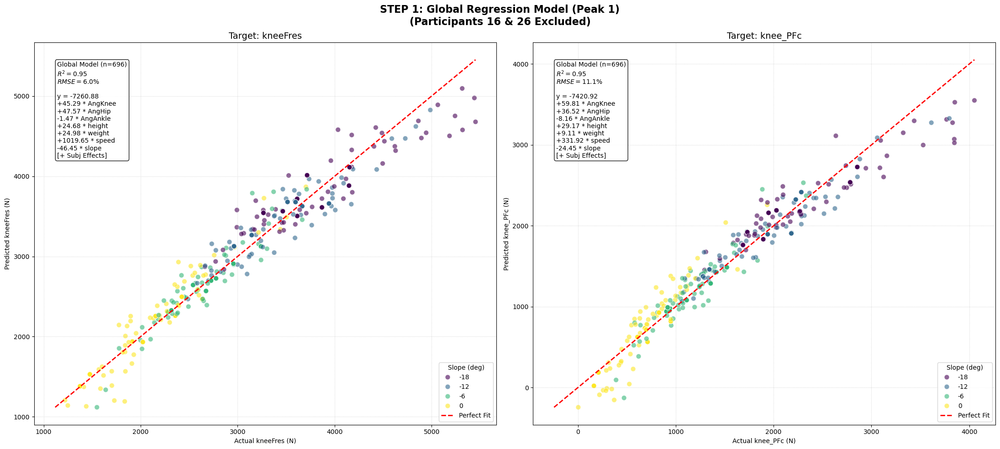


=== GLOBAL REGRESSION RESULTS (Excl. 16 & 26) ===


,Target,R2,RMSE (%),Equation
0,kneeFres,0.950778,6.03%,y = -7260.88 +45.29 * AngKnee +47.57 * AngHip -1.47 * AngAnkle +24.68 * height +24.98 * weight +1019.65 * speed -46.45 * slope [+ Subj Effects]
1,knee_PFc,0.953329,11.12%,y = -7420.92 +59.81 * AngKnee +36.52 * AngHip -8.16 * AngAnkle +29.17 * height +9.11 * weight +331.92 * speed -24.45 * slope [+ Subj Effects]


In [21]:
# ==============================================================================
# --- 1. SETUP PARAMETERS (GLOBAL REGRESSION - PEAK 1) ---
# ==============================================================================
targets = ['kneeFres', 'knee_PFc'] 
event_type = 'First_Peak_GRF' # <--- PEAK 1 (Impact)

# We include 'slope' as a predictor here
global_features = ['angleKnee', 'angleHip', 'angleAnkle', 'height', 'weight', 'speed', 'slope']

# --- PREPARE DATA ---
# 1. Combine datasets
df_self_selected['Condition'] = 'Self-selected'
df_constant['Condition'] = 'Constant'
df_global = pd.concat([df_self_selected, df_constant], ignore_index=True)

# 2. Filter for Peak 1
df_global = df_global[df_global['Event_Type'] == event_type].copy()

# 3. Handle IDs
df_global['id'] = df_global['id'].astype(str).str.strip()

# --- EXCLUSION DES PARTICIPANTS 16 et 26 ---
participants_to_exclude = ['16','26']
df_global = df_global[~df_global['id'].isin(participants_to_exclude)].copy()
print(f"Participants exclus : {participants_to_exclude}")
# ---------------------------------------------------

print(f"--- GLOBAL REGRESSION ANALYSIS (PEAK 1) ---")
print(f"Total samples: {len(df_global)}")

# ==============================================================================
# --- 2. MAIN ANALYSIS LOOP ---
# ==============================================================================
results_global = []
fig, axes = plt.subplots(1, 2, figsize=(22, 10))
fig.suptitle(f"STEP 1: Global Regression Model (Peak 1)\n(Participants 16 & 26 Excluded)", 
             fontsize=16, fontweight='bold')

for i, target in enumerate(targets):
    ax = axes[i]
    
    # A. Data Cleaning
    cols_needed = global_features + [target, 'id']
    data_clean = df_global.dropna(subset=cols_needed).copy()
    
    # B. Feature Engineering (Subject Dummies)
    participant_dummies = pd.get_dummies(data_clean['id'], prefix='Subj', drop_first=True)
    
    # X includes Features + Slope + Subjects
    X = pd.concat([data_clean[global_features], participant_dummies], axis=1)
    y = data_clean[target]
    
    # C. Model Fitting
    model = LinearRegression()
    model.fit(X, y)
    y_pred = model.predict(X)
    
    # D. Statistics
    r2 = r2_score(y, y_pred)
    rmse_val = np.sqrt(mean_squared_error(y, y_pred))
    
    # --- CALCUL DU RMSE EN POURCENTAGE (NRMSE) ---
    mean_y = np.mean(y)
    rmse_pct = (rmse_val / mean_y) * 100
    
    # --- E. CONSTRUCT EQUATION STRING ---
    eq_str = f"y = {model.intercept_:.2f}"
    
    for name, coef in zip(X.columns, model.coef_):
        if 'Subj' not in name:
            clean_name = name.replace("angle", "Ang")
            eq_str += f"\n{coef:+.2f} * {clean_name}"
            
    eq_str += "\n[+ Subj Effects]" 
    
    # --- SAVE RESULTS ---
    eq_str_table = eq_str.replace('\n', ' ')
    
    results_global.append({
        'Target': target, 
        'R2': r2, 
        'RMSE (%)': rmse_pct, # Stockage en pourcentage
        'Equation': eq_str_table
    })

    # F. VISUALIZATION
    
    # 1. Plot Points
    sns.scatterplot(
        x=y, y=y_pred, 
        hue=data_clean['slope'], palette='viridis', 
        s=60, alpha=0.6, ax=ax
    )
    
    # 2. Perfect Fit Line
    min_val = min(y.min(), y_pred.min())
    max_val = max(y.max(), y_pred.max())
    ax.plot([min_val, max_val], [min_val, max_val], color='red', linestyle='--', linewidth=2, label='Perfect Fit')
    
    # 3. Stats Box (Mise à jour avec %)
    # On utilise \% pour afficher le signe pourcentage proprement
    text_str = f"Global Model (n={len(data_clean)})\n$R^2 = {r2:.2f}$\n$RMSE = {rmse_pct:.1f}\%$\n\n{eq_str}"
    
    props = dict(boxstyle='round', facecolor='white', alpha=0.9, edgecolor='black')
    ax.text(0.05, 0.95, text_str, transform=ax.transAxes, fontsize=10, verticalalignment='top', bbox=props)
    
    ax.set_title(f"Target: {target}", fontsize=14)
    ax.set_xlabel(f"Actual {target} (N)")
    ax.set_ylabel(f"Predicted {target} (N)")
    ax.legend(title='Slope (deg)', loc='lower right')
    ax.grid(True, linestyle=':', alpha=0.6)

plt.tight_layout()
plt.show()

# --- PRINT SUMMARY TABLE ---
print("\n=== GLOBAL REGRESSION RESULTS (Excl. 16 & 26) ===")
summary_df = pd.DataFrame(results_global)

# Formatage pour l'affichage
summary_df['RMSE (%)'] = summary_df['RMSE (%)'].map('{:.2f}%'.format)

pd.set_option('display.max_colwidth', None)
display(summary_df)

* Global regression Peak 2 without outliers (...)

Excluded Participants: ['16', '26']
--- GLOBAL REGRESSION ANALYSIS (PEAK 2) ---
Total samples: 696


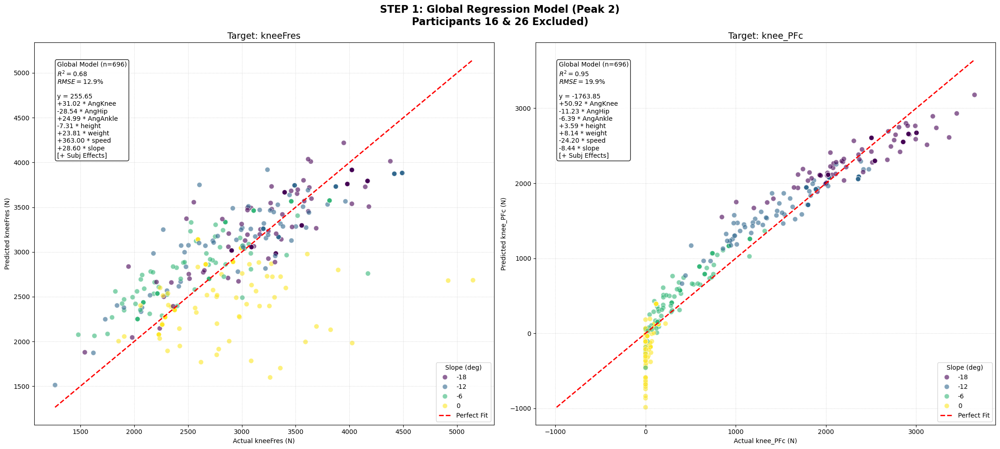


=== GLOBAL REGRESSION RESULTS PEAK 2 (Excl. 16 & 26) ===


,Target,R2,RMSE (%),Equation
0,kneeFres,0.678250,12.85%,y = 255.65 +31.02 * AngKnee -28.54 * AngHip +24.99 * AngAnkle -7.31 * height +23.81 * weight +363.00 * speed +28.60 * slope [+ Subj Effects]
1,knee_PFc,0.950014,19.89%,y = -1763.85 +50.92 * AngKnee -11.23 * AngHip -6.39 * AngAnkle +3.59 * height +8.14 * weight -24.20 * speed -8.44 * slope [+ Subj Effects]


In [22]:
# ==============================================================================
# --- 1. SETUP PARAMETERS (GLOBAL REGRESSION - PEAK 2) ---
# ==============================================================================
targets = ['kneeFres', 'knee_PFc'] 
event_type = 'Second_Peak_GRF' # <--- PEAK 2

# We include 'slope' as a predictor here
global_features = ['angleKnee', 'angleHip', 'angleAnkle', 'height', 'weight', 'speed', 'slope']

# --- PREPARE DATA ---
# 1. Combine datasets (Using Peak 2 Dataframes)
df_peak2_self_selected['Condition'] = 'Self-selected'
df_peak2_constant['Condition'] = 'Constant'

df_global_p2 = pd.concat([df_peak2_self_selected, df_peak2_constant], ignore_index=True)

# 2. Filter for Peak 2
df_global_p2 = df_global_p2[df_global_p2['Event_Type'] == event_type].copy()

# 3. Handle IDs
df_global_p2['id'] = df_global_p2['id'].astype(str).str.strip()

# --- EXCLUSION OF PARTICIPANTS 16 & 26 ---
participants_to_exclude = ['16', '26']
df_global_p2 = df_global_p2[~df_global_p2['id'].isin(participants_to_exclude)].copy()
print(f"Excluded Participants: {participants_to_exclude}")
# ---------------------------------------------------

print(f"--- GLOBAL REGRESSION ANALYSIS (PEAK 2) ---")
print(f"Total samples: {len(df_global_p2)}")

# ==============================================================================
# --- 2. MAIN ANALYSIS LOOP ---
# ==============================================================================
results_global_p2 = []
fig, axes = plt.subplots(1, 2, figsize=(22, 10)) 
fig.suptitle(f"STEP 1: Global Regression Model (Peak 2)\nParticipants 16 & 26 Excluded)", 
             fontsize=16, fontweight='bold')

for i, target in enumerate(targets):
    ax = axes[i]
    
    # A. Data Cleaning
    cols_needed = global_features + [target, 'id']
    data_clean = df_global_p2.dropna(subset=cols_needed).copy()
    
    # B. Feature Engineering (Subject Dummies)
    # We INCLUDE Subject ID to account for inter-subject variability
    participant_dummies = pd.get_dummies(data_clean['id'], prefix='Subj', drop_first=True)
    
    # X includes Features + Slope + Subjects
    X = pd.concat([data_clean[global_features], participant_dummies], axis=1)
    y = data_clean[target]
    
    # C. Model Fitting
    model = LinearRegression()
    model.fit(X, y)
    y_pred = model.predict(X)
    
    # D. Statistics
    r2 = r2_score(y, y_pred)
    rmse_val = np.sqrt(mean_squared_error(y, y_pred))
    
    # --- CALCUL DU RMSE EN POURCENTAGE (NRMSE) ---
    mean_y = np.mean(y)
    rmse_pct = (rmse_val / mean_y) * 100
    
    # --- E. CONSTRUCT EQUATION STRING ---
    eq_str = f"y = {model.intercept_:.2f}"
    
    for name, coef in zip(X.columns, model.coef_):
        # We hide "Subj" coefficients for readability, but show biomechanical vars
        if 'Subj' not in name:
            clean_name = name.replace("angle", "Ang")
            eq_str += f"\n{coef:+.2f} * {clean_name}"
            
    eq_str += "\n[+ Subj Effects]" 
    
    # --- SAVE RESULTS ---
    eq_str_table = eq_str.replace('\n', ' ')
    
    results_global_p2.append({
        'Target': target, 
        'R2': r2, 
        'RMSE (%)': rmse_pct, # On stocke le pourcentage
        'Equation': eq_str_table
    })

    # F. VISUALIZATION
    
    # 1. Plot Points
    sns.scatterplot(
        x=y, y=y_pred, 
        hue=data_clean['slope'], palette='viridis', 
        s=60, alpha=0.6, ax=ax
    )
    
    # 2. Perfect Fit Line
    min_val = min(y.min(), y_pred.min())
    max_val = max(y.max(), y_pred.max())
    ax.plot([min_val, max_val], [min_val, max_val], color='red', linestyle='--', linewidth=2, label='Perfect Fit')
    
    # 3. Stats Box (AVEC RMSE EN %)
    # Note: \% est nécessaire en LaTeX pour afficher le signe %
    text_str = f"Global Model (n={len(data_clean)})\n$R^2 = {r2:.2f}$\n$RMSE = {rmse_pct:.1f}\%$\n\n{eq_str}"
    
    props = dict(boxstyle='round', facecolor='white', alpha=0.9, edgecolor='black')
    ax.text(0.05, 0.95, text_str, transform=ax.transAxes, fontsize=10, verticalalignment='top', bbox=props)
    
    ax.set_title(f"Target: {target}", fontsize=14)
    ax.set_xlabel(f"Actual {target} (N)")
    ax.set_ylabel(f"Predicted {target} (N)")
    ax.legend(title='Slope (deg)', loc='lower right')
    ax.grid(True, linestyle=':', alpha=0.6)

plt.tight_layout()
plt.show()

# --- PRINT SUMMARY TABLE ---
print("\n=== GLOBAL REGRESSION RESULTS PEAK 2 (Excl. 16 & 26) ===")
summary_df_p2 = pd.DataFrame(results_global_p2)

# Formatage pour l'affichage en pourcentage
summary_df_p2['RMSE (%)'] = summary_df_p2['RMSE (%)'].map('{:.2f}%'.format)

pd.set_option('display.max_colwidth', None) 
display(summary_df_p2)

# IV. Analysis by slope

* Peak 1

--- SLOPE ANALYSIS (PEAK 1) ---
Excluded participants : ['16', '26']


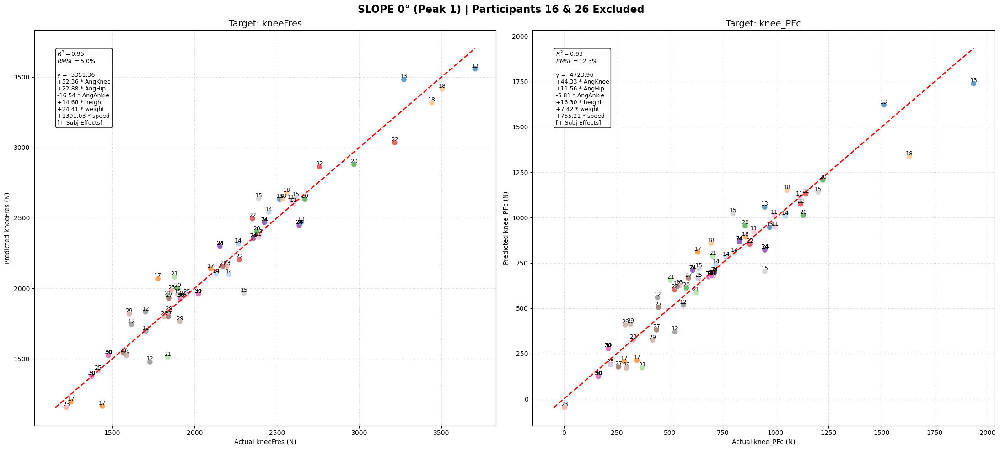

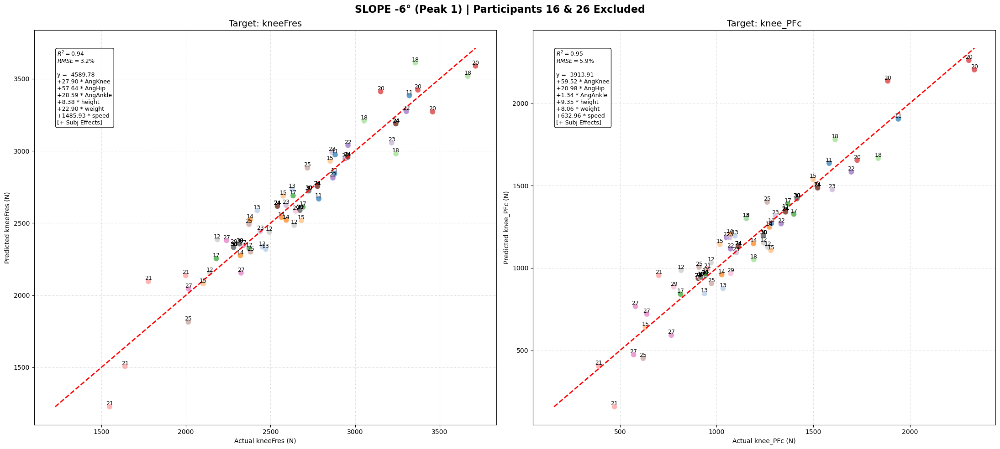

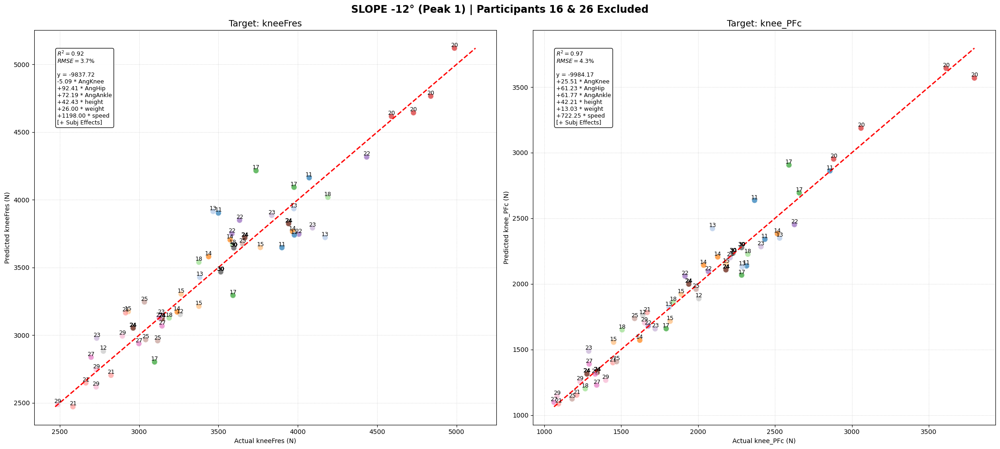

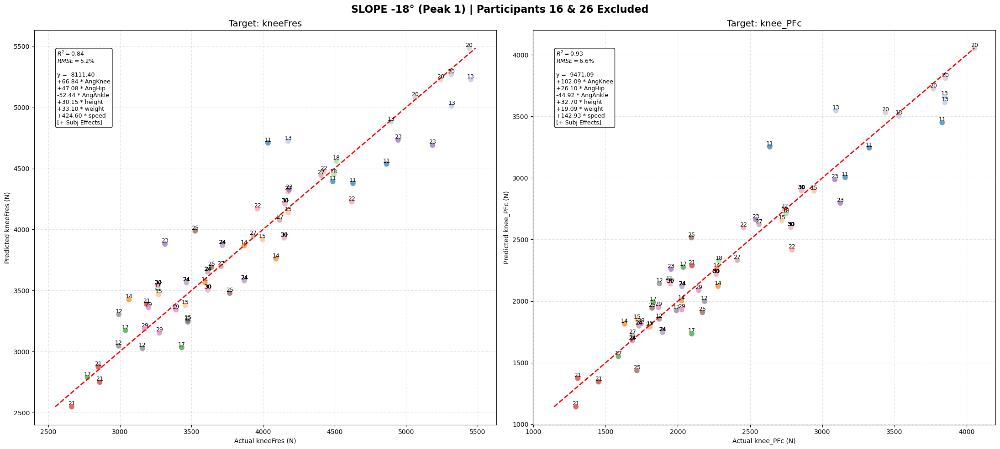


=== DETAILED RESULTS BY SLOPE ===


,Slope,Target,R2,RMSE (%),Equation
0,0,kneeFres,0.949757,5.03%,y = -5351.36 +52.36 * AngKnee +22.88 * AngHip -16.54 * AngAnkle +14.68 * height +24.41 * weight +1391.03 * speed [+ Subj Effects]
1,0,knee_PFc,0.931350,12.35%,y = -4723.96 +44.33 * AngKnee +11.56 * AngHip -5.81 * AngAnkle +16.30 * height +7.42 * weight +755.21 * speed [+ Subj Effects]
2,-6,kneeFres,0.944846,3.20%,y = -4589.78 +27.90 * AngKnee +57.64 * AngHip +28.59 * AngAnkle +8.38 * height +22.90 * weight +1485.93 * speed [+ Subj Effects]
3,-6,knee_PFc,0.945310,5.94%,y = -3913.91 +59.52 * AngKnee +20.98 * AngHip +1.34 * AngAnkle +9.35 * height +8.06 * weight +632.96 * speed [+ Subj Effects]
4,-12,kneeFres,0.918631,3.66%,y = -9837.72 -5.09 * AngKnee +92.41 * AngHip +72.19 * AngAnkle +42.43 * height +26.00 * weight +1198.00 * speed [+ Subj Effects]
5,-12,knee_PFc,0.972486,4.33%,y = -9984.17 +25.51 * AngKnee +61.23 * AngHip +61.77 * AngAnkle +42.21 * height +13.03 * weight +722.25 * speed [+ Subj Effects]
6,-18,kneeFres,0.841007,5.24%,y = -8111.40 +66.84 * AngKnee +47.08 * AngHip -52.44 * AngAnkle +30.15 * height +33.10 * weight +424.60 * speed [+ Subj Effects]
7,-18,knee_PFc,0.928739,6.57%,y = -9471.09 +102.09 * AngKnee +26.10 * AngHip -44.92 * AngAnkle +32.70 * height +19.09 * weight +142.93 * speed [+ Subj Effects]


In [23]:
# ==============================================================================
# --- 1. SETUP PARAMETERS (PEAK 1 - ANALYSIS BY SLOPE) ---
# ==============================================================================
targets = ['kneeFres', 'knee_PFc'] 
event_type = 'First_Peak_GRF' # <--- PEAK 1
slopes = [0, -6, -12, -18] # Ordre d'affichage

# Features (Slope est fixe donc retirée)
features_per_slope = ['angleKnee', 'angleHip', 'angleAnkle', 'height', 'weight', 'speed']

# --- PREPARE DATA ---
df_self_selected['Condition'] = 'Self-selected'
df_constant['Condition'] = 'Constant'
df_global = pd.concat([df_self_selected, df_constant], ignore_index=True)

# Filter for Peak 1
df_global = df_global[df_global['Event_Type'] == event_type].copy()
df_global['id'] = df_global['id'].astype(str).str.strip()

# EXCLUSION PARTICIPANTS 16 & 26
participants_to_exclude = ['16', '26']
df_global = df_global[~df_global['id'].isin(participants_to_exclude)].copy()

print(f"--- SLOPE ANALYSIS (PEAK 1) ---")
print(f"Excluded participants : {participants_to_exclude}")

# ==============================================================================
# --- 2. MAIN LOOP (SLOPE FIRST) ---
# ==============================================================================
results_by_slope = []

for slope in slopes:
    
    # 1. Filtre Pente
    df_slope = df_global[df_global['slope'] == slope].copy()
    
    if len(df_slope) < 10:
        continue

    # 2. Figure
    fig, axes = plt.subplots(1, 2, figsize=(22, 10))
    fig.suptitle(f"SLOPE {slope}° (Peak 1) | Participants 16 & 26 Excluded", 
                 fontsize=16, fontweight='bold')
    
    # 3. Boucle Targets
    for i, target in enumerate(targets):
        ax = axes[i]
        
        # A. Data Cleaning
        cols_needed = features_per_slope + [target, 'id']
        data_clean = df_slope.dropna(subset=cols_needed).copy()
        
        # B. Model
        participant_dummies = pd.get_dummies(data_clean['id'], prefix='Subj', drop_first=True)
        X = pd.concat([data_clean[features_per_slope], participant_dummies], axis=1)
        y = data_clean[target]
        
        model = LinearRegression()
        model.fit(X, y)
        y_pred = model.predict(X)
        
        # C. Stats & Equation
        r2 = r2_score(y, y_pred)
        rmse_val = np.sqrt(mean_squared_error(y, y_pred))
        
        # --- CALCUL DU RMSE EN POURCENTAGE (NRMSE) ---
        mean_y = np.mean(y)
        rmse_pct = (rmse_val / mean_y) * 100
        
        eq_str = f"y = {model.intercept_:.2f}"
        for name, coef in zip(X.columns, model.coef_):
            if 'Subj' not in name:
                clean_name = name.replace("angle", "Ang")
                eq_str += f"\n{coef:+.2f} * {clean_name}"
        eq_str += "\n[+ Subj Effects]" 
        
        results_by_slope.append({
            'Slope': slope, 'Target': target,
            'R2': r2, 
            'RMSE (%)': rmse_pct, # On stocke le pourcentage ici
            'Equation': eq_str.replace('\n', ' ')
        })
        
        # D. VISUALIZATION
        
        # 1. Scatterplot avec COULEUR par ID
        sns.scatterplot(
            x=y, y=y_pred, 
            hue=data_clean['id'], palette='tab20', 
            s=80, alpha=0.7, ax=ax,
            legend=False 
        )
        
        # 2. Affichage des NUMÉROS (IDs) sur chaque point
        for actual, predicted, pid in zip(y, y_pred, data_clean['id']):
            ax.text(actual, predicted, pid, 
                    fontsize=9, color='black', ha='center', va='bottom', fontweight='light')
        
        # 3. Perfect Fit Line
        min_val = min(y.min(), y_pred.min())
        max_val = max(y.max(), y_pred.max())
        ax.plot([min_val, max_val], [min_val, max_val], color='red', linestyle='--', linewidth=2, label='Perfect Fit')
        
        # 4. Stats Box (AVEC RMSE EN %)
        # Note : \% permet d'afficher le signe % en LaTeX/Matplotlib
        text_str = f"$R^2 = {r2:.2f}$\n$RMSE = {rmse_pct:.1f}\%$\n\n{eq_str}"
        props = dict(boxstyle='round', facecolor='white', alpha=0.9, edgecolor='black')
        ax.text(0.05, 0.95, text_str, transform=ax.transAxes, fontsize=9, verticalalignment='top', bbox=props)
        
        ax.set_title(f"Target: {target}", fontsize=14)
        ax.set_xlabel(f"Actual {target} (N)")
        ax.set_ylabel(f"Predicted {target} (N)")
        ax.grid(True, linestyle=':', alpha=0.6)
        
    plt.tight_layout()
    plt.show()

# --- SUMMARY TABLE ---
print("\n=== DETAILED RESULTS BY SLOPE ===")
summary_df = pd.DataFrame(results_by_slope)

# Formatage pour l'affichage du tableau
summary_df['RMSE (%)'] = summary_df['RMSE (%)'].map('{:.2f}%'.format)

pd.set_option('display.max_colwidth', None)
display(summary_df)

* Peak 2

--- SLOPE ANALYSIS (PEAK 2 - PROPULSION) ---
Excluded participants : ['16', '26']
Total samples: 696


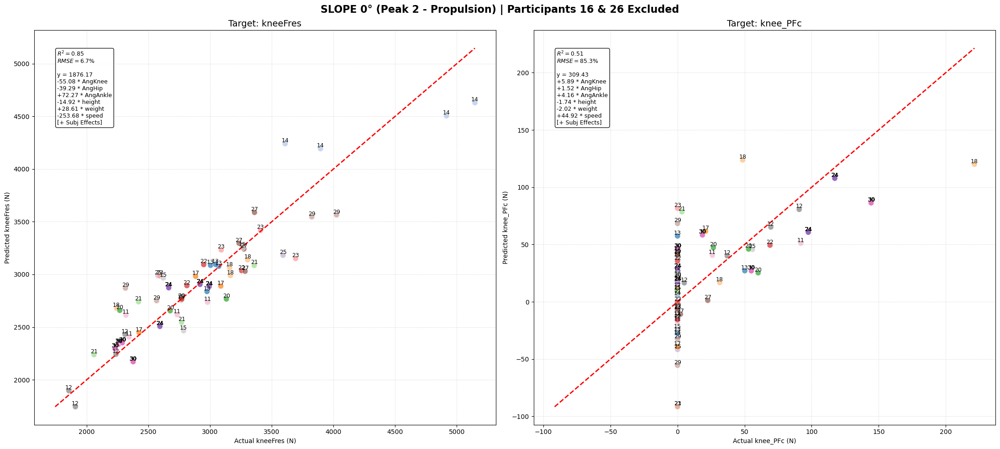

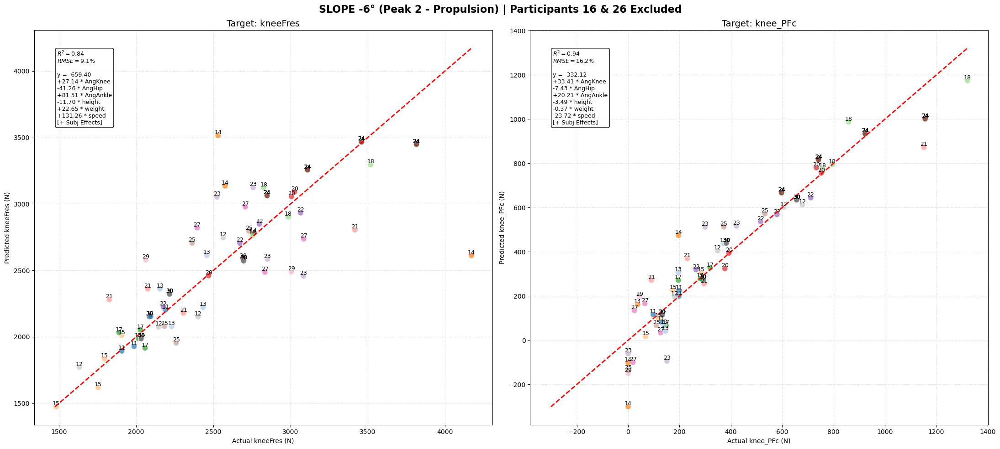

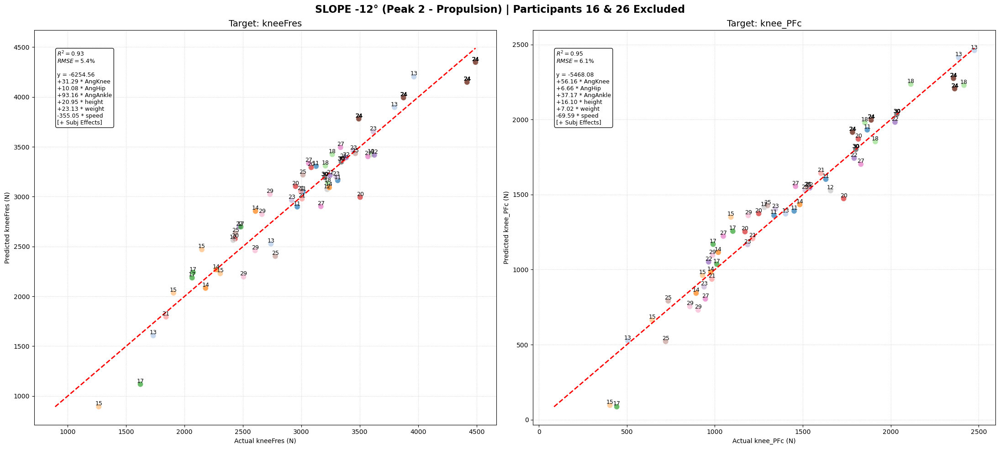

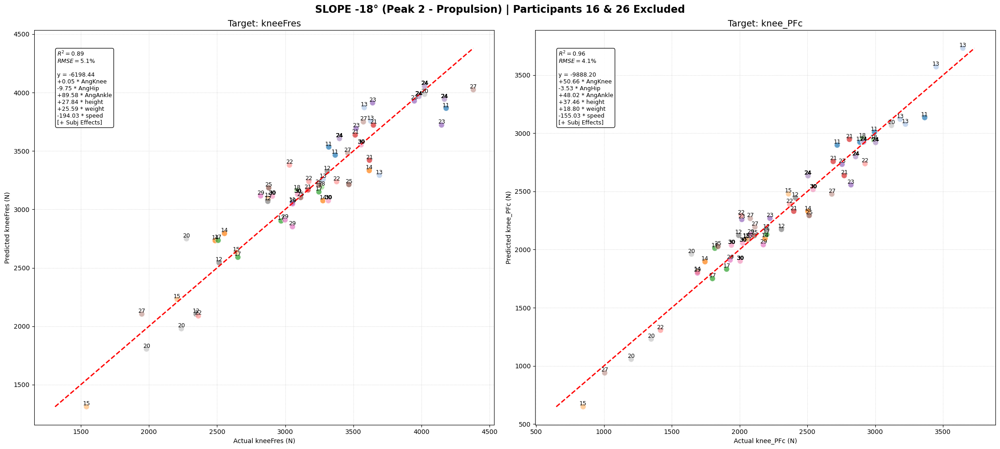


=== DETAILED RESULTS BY SLOPE (PEAK 2) ===


,Slope,Target,R2,RMSE (%),Equation
0,0,kneeFres,0.852891,6.68%,y = 1876.17 -55.08 * AngKnee -39.29 * AngHip +72.27 * AngAnkle -14.92 * height +28.61 * weight -253.68 * speed [+ Subj Effects]
1,0,knee_PFc,0.509814,85.31%,y = 309.43 +5.89 * AngKnee +1.52 * AngHip +4.16 * AngAnkle -1.74 * height -2.02 * weight +44.92 * speed [+ Subj Effects]
2,-6,kneeFres,0.836048,9.05%,y = -659.40 +27.14 * AngKnee -41.26 * AngHip +81.51 * AngAnkle -11.70 * height +22.65 * weight +131.26 * speed [+ Subj Effects]
3,-6,knee_PFc,0.937022,16.23%,y = -332.12 +33.41 * AngKnee -7.43 * AngHip +20.21 * AngAnkle -3.49 * height -0.37 * weight -23.72 * speed [+ Subj Effects]
4,-12,kneeFres,0.930758,5.36%,y = -6254.56 +31.29 * AngKnee +10.08 * AngHip +93.16 * AngAnkle +20.95 * height +23.13 * weight -355.05 * speed [+ Subj Effects]
5,-12,knee_PFc,0.950313,6.13%,y = -5468.08 +56.16 * AngKnee +6.66 * AngHip +37.17 * AngAnkle +16.10 * height +7.02 * weight -69.59 * speed [+ Subj Effects]
6,-18,kneeFres,0.891938,5.07%,y = -6198.44 +0.05 * AngKnee -9.75 * AngHip +89.58 * AngAnkle +27.84 * height +25.59 * weight -194.03 * speed [+ Subj Effects]
7,-18,knee_PFc,0.957990,4.09%,y = -9888.20 +50.66 * AngKnee -3.53 * AngHip +48.02 * AngAnkle +37.46 * height +18.80 * weight -155.03 * speed [+ Subj Effects]


In [24]:
# ==============================================================================
# --- 1. SETUP PARAMETERS (PEAK 2) ---
# ==============================================================================
targets = ['kneeFres', 'knee_PFc'] 
event_type = 'Second_Peak_GRF' # <--- PEAK 2
slopes = [0, -6, -12, -18] 

# Features
features_per_slope = ['angleKnee', 'angleHip', 'angleAnkle', 'height', 'weight', 'speed']

# --- PREPARE DATA ---
# On utilise les dataframes spécifiques au Peak 2 s'ils existent, sinon on filtre le global
# Pour être sûr, on recombine tout ici :
df_peak2_self_selected['Condition'] = 'Self-selected'
df_peak2_constant['Condition'] = 'Constant'
df_global_p2 = pd.concat([df_peak2_self_selected, df_peak2_constant], ignore_index=True)

# Filter for Peak 2
df_global_p2 = df_global_p2[df_global_p2['Event_Type'] == event_type].copy()
df_global_p2['id'] = df_global_p2['id'].astype(str).str.strip()

# EXCLUSION PARTICIPANTS 16 & 26
participants_to_exclude = ['16', '26']
df_global_p2 = df_global_p2[~df_global_p2['id'].isin(participants_to_exclude)].copy()

print(f"--- SLOPE ANALYSIS (PEAK 2 - PROPULSION) ---")
print(f"Excluded participants : {participants_to_exclude}")
print(f"Total samples: {len(df_global_p2)}")

# ==============================================================================
# --- 2. MAIN LOOP (SLOPE FIRST) ---
# ==============================================================================
results_by_slope_p2 = []

for slope in slopes:
    
    # 1. Filtre Pente
    df_slope = df_global_p2[df_global_p2['slope'] == slope].copy()
    
    if len(df_slope) < 10:
        print(f"Skipping Slope {slope}: Not enough data.")
        continue

    # 2. Figure
    fig, axes = plt.subplots(1, 2, figsize=(22, 10))
    fig.suptitle(f"SLOPE {slope}° (Peak 2 - Propulsion) | Participants 16 & 26 Excluded", 
                 fontsize=16, fontweight='bold')
    
    # 3. Boucle Targets
    for i, target in enumerate(targets):
        ax = axes[i]
        
        # A. Data Cleaning
        cols_needed = features_per_slope + [target, 'id']
        data_clean = df_slope.dropna(subset=cols_needed).copy()
        
        # B. Model
        participant_dummies = pd.get_dummies(data_clean['id'], prefix='Subj', drop_first=True)
        X = pd.concat([data_clean[features_per_slope], participant_dummies], axis=1)
        y = data_clean[target]
        
        model = LinearRegression()
        model.fit(X, y)
        y_pred = model.predict(X)
        
        # C. Stats & Equation
        r2 = r2_score(y, y_pred)
        rmse_val = np.sqrt(mean_squared_error(y, y_pred))
        
        # --- CALCUL DU RMSE EN POURCENTAGE (NRMSE) ---
        mean_y = np.mean(y)
        rmse_pct = (rmse_val / mean_y) * 100
        
        eq_str = f"y = {model.intercept_:.2f}"
        for name, coef in zip(X.columns, model.coef_):
            if 'Subj' not in name:
                clean_name = name.replace("angle", "Ang")
                eq_str += f"\n{coef:+.2f} * {clean_name}"
        eq_str += "\n[+ Subj Effects]" 
        
        results_by_slope_p2.append({
            'Slope': slope, 'Target': target,
            'R2': r2, 
            'RMSE (%)': rmse_pct, 
            'Equation': eq_str.replace('\n', ' ')
        })
        
        # D. VISUALIZATION
        
        # 1. Scatterplot avec COULEUR par ID
        sns.scatterplot(
            x=y, y=y_pred, 
            hue=data_clean['id'], palette='tab20', 
            s=80, alpha=0.7, ax=ax,
            legend=False 
        )
        
        # 2. Affichage des NUMÉROS (IDs) sur chaque point
        for actual, predicted, pid in zip(y, y_pred, data_clean['id']):
            ax.text(actual, predicted, pid, 
                    fontsize=9, color='black', ha='center', va='bottom', fontweight='light')
        
        # 3. Perfect Fit Line
        min_val = min(y.min(), y_pred.min())
        max_val = max(y.max(), y_pred.max())
        ax.plot([min_val, max_val], [min_val, max_val], color='red', linestyle='--', linewidth=2, label='Perfect Fit')
        
        # 4. Stats Box (AVEC RMSE EN %)
        text_str = f"$R^2 = {r2:.2f}$\n$RMSE = {rmse_pct:.1f}\%$\n\n{eq_str}"
        props = dict(boxstyle='round', facecolor='white', alpha=0.9, edgecolor='black')
        ax.text(0.05, 0.95, text_str, transform=ax.transAxes, fontsize=9, verticalalignment='top', bbox=props)
        
        ax.set_title(f"Target: {target}", fontsize=14)
        ax.set_xlabel(f"Actual {target} (N)")
        ax.set_ylabel(f"Predicted {target} (N)")
        ax.grid(True, linestyle=':', alpha=0.6)
        
    plt.tight_layout()
    plt.show()

# --- SUMMARY TABLE ---
print("\n=== DETAILED RESULTS BY SLOPE (PEAK 2) ===")
summary_df_p2 = pd.DataFrame(results_by_slope_p2)

# Formatage
summary_df_p2['RMSE (%)'] = summary_df_p2['RMSE (%)'].map('{:.2f}%'.format)

pd.set_option('display.max_colwidth', None)
display(summary_df_p2)

# V. Speed comparison

* Peak 1

--- SLOPE ANALYSIS (PEAK 1) ---
Separating by Condition: ['Self-selected', 'Constant']
Excluded participants : ['16', '26']


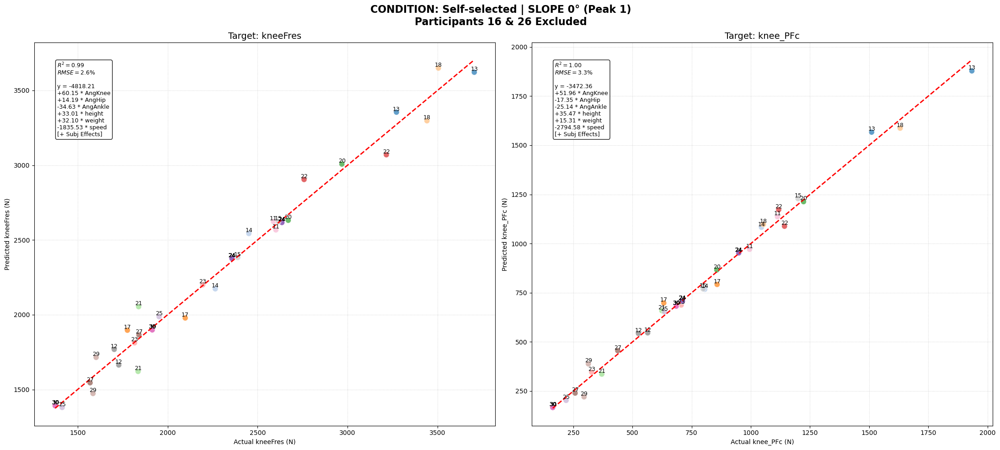

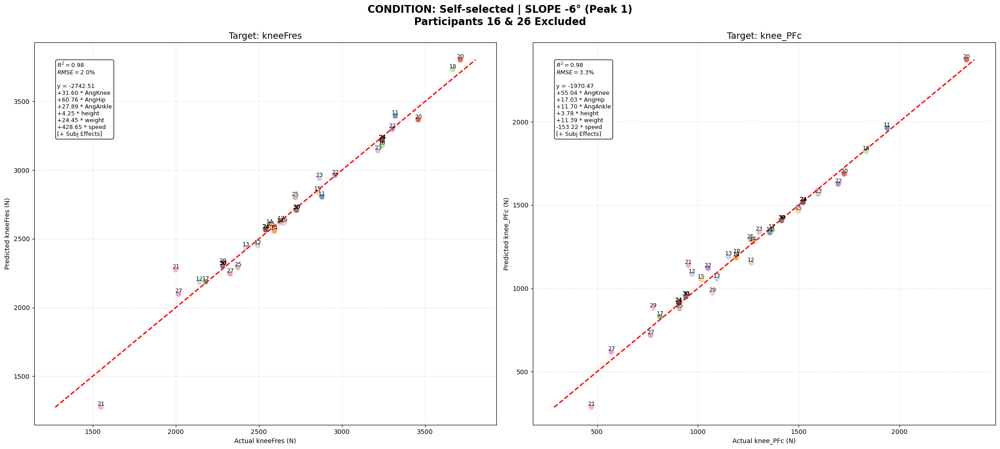

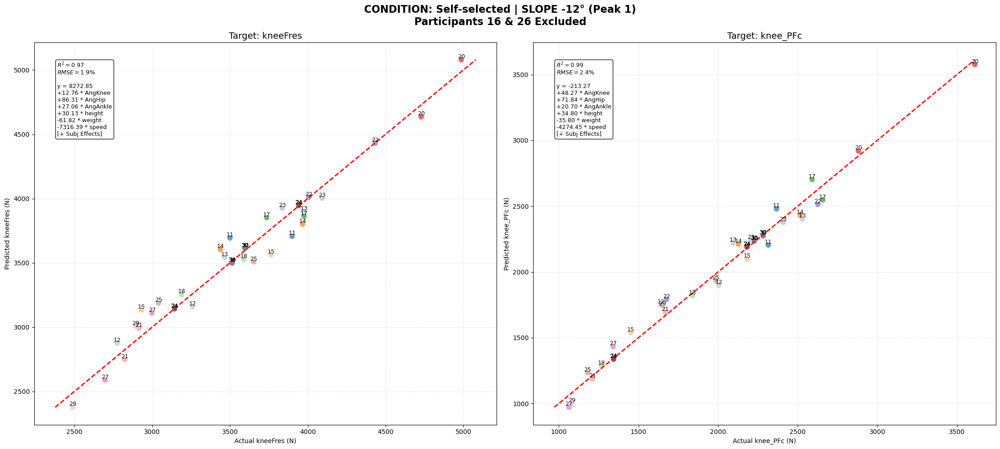

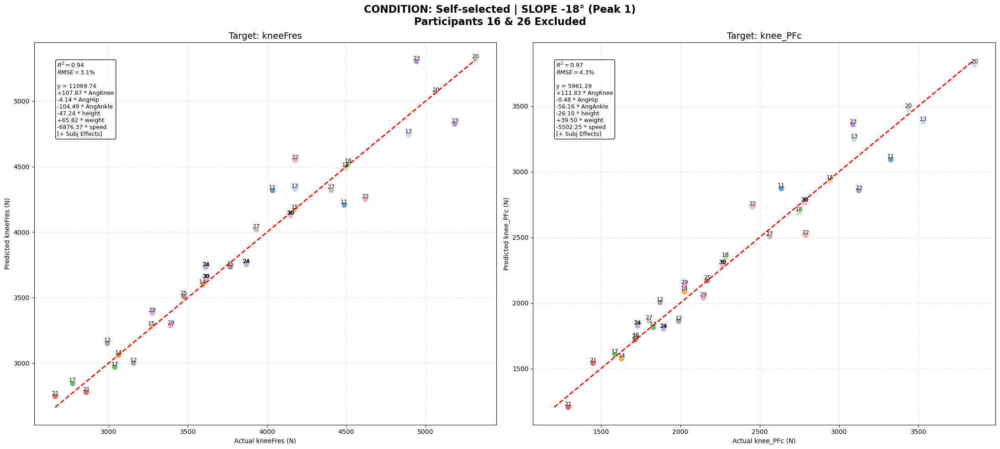

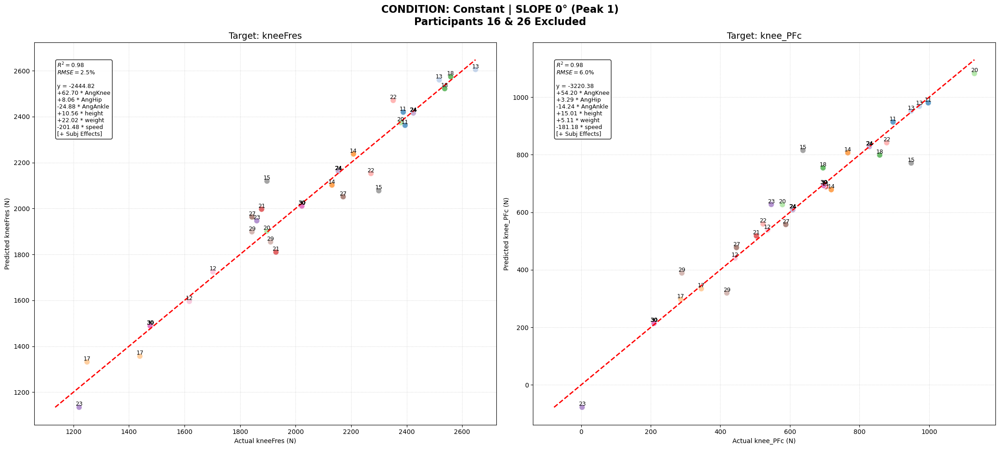

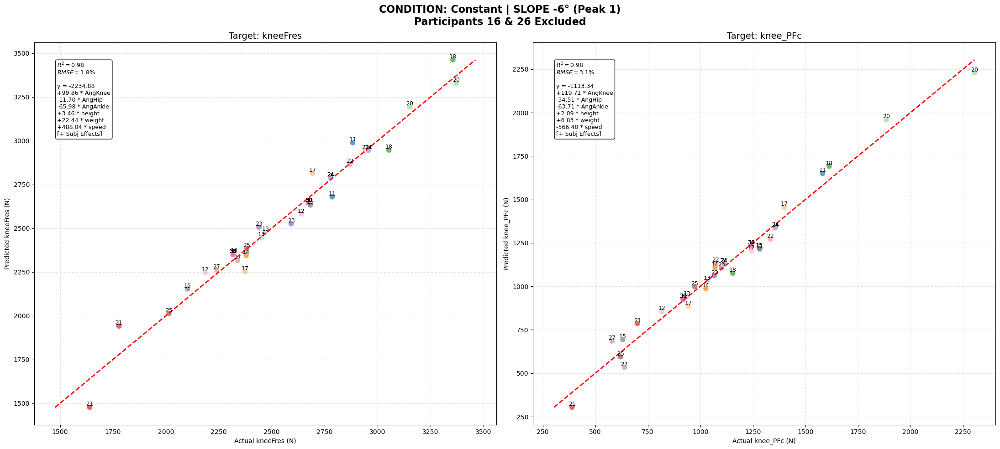

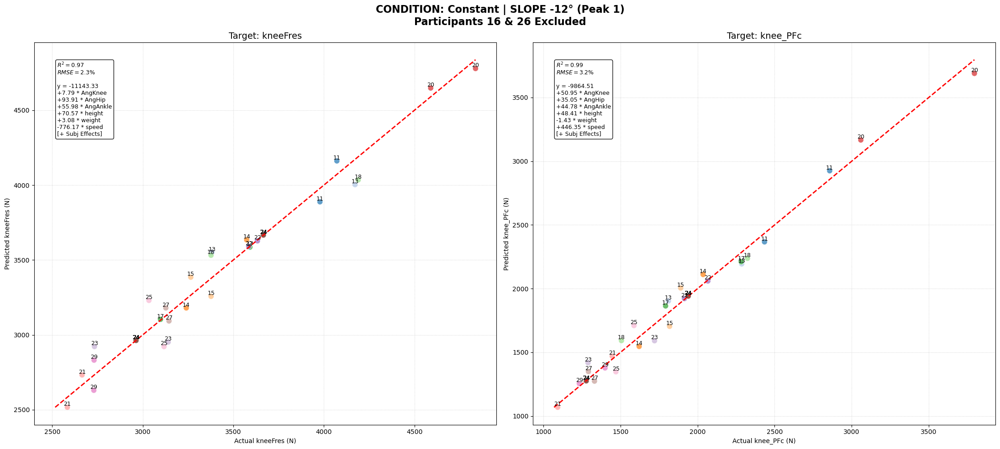

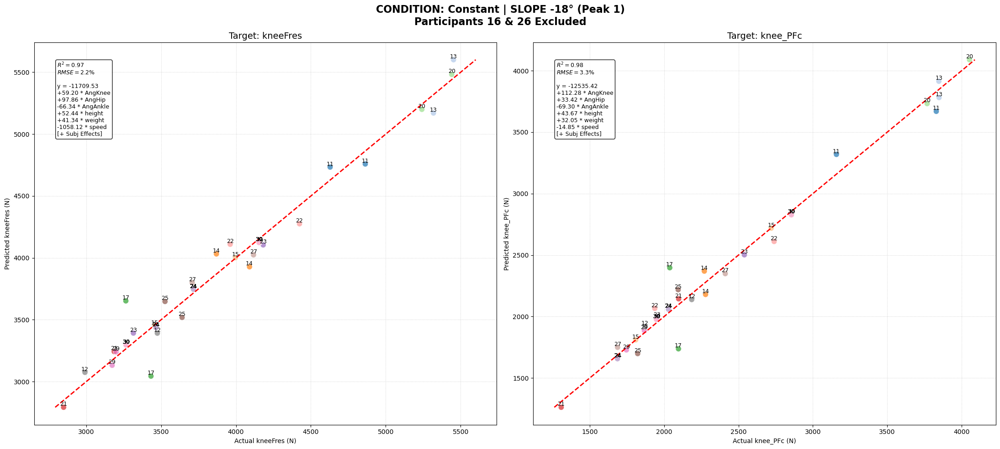


=== DETAILED RESULTS BY CONDITION & SLOPE ===


,Condition,Slope,Target,R2,RMSE (%),Equation
0,Self-selected,0,kneeFres,0.989,2.65%,y = -4818.21 +60.15 * AngKnee +14.19 * AngHip -34.63 * AngAnkle +33.01 * height +32.10 * weight -1835.53 * speed [+ Subj Effects]
1,Self-selected,0,knee_PFc,0.996,3.30%,y = -3472.36 +51.96 * AngKnee -17.35 * AngHip -25.14 * AngAnkle +35.47 * height +15.31 * weight -2794.58 * speed [+ Subj Effects]
2,Self-selected,-6,kneeFres,0.983,2.00%,y = -2742.51 +31.60 * AngKnee +60.76 * AngHip +27.89 * AngAnkle +4.25 * height +24.45 * weight +428.65 * speed [+ Subj Effects]
3,Self-selected,-6,knee_PFc,0.985,3.30%,y = -1970.47 +55.04 * AngKnee +17.03 * AngHip +11.70 * AngAnkle +3.78 * height +11.39 * weight -153.22 * speed [+ Subj Effects]
4,Self-selected,-12,kneeFres,0.973,1.91%,y = 8272.85 +12.76 * AngKnee +86.31 * AngHip +27.06 * AngAnkle +30.13 * height -61.82 * weight -7316.39 * speed [+ Subj Effects]
5,Self-selected,-12,knee_PFc,0.990,2.36%,y = -213.27 +48.27 * AngKnee +71.84 * AngHip +20.70 * AngAnkle +34.80 * height -35.80 * weight -4274.45 * speed [+ Subj Effects]
6,Self-selected,-18,kneeFres,0.936,3.10%,y = 11069.74 +107.87 * AngKnee -4.14 * AngHip -104.49 * AngAnkle -47.24 * height +65.82 * weight -6876.37 * speed [+ Subj Effects]
7,Self-selected,-18,knee_PFc,0.966,4.27%,y = 5961.29 +111.83 * AngKnee -0.48 * AngHip -56.16 * AngAnkle -26.10 * height +39.50 * weight -5502.25 * speed [+ Subj Effects]
8,Constant,0,kneeFres,0.980,2.52%,y = -2444.82 +62.70 * AngKnee +8.06 * AngHip -24.88 * AngAnkle +10.56 * height +22.02 * weight -201.48 * speed [+ Subj Effects]
9,Constant,0,knee_PFc,0.978,6.00%,y = -3220.38 +54.20 * AngKnee +3.29 * AngHip -14.24 * AngAnkle +15.01 * height +5.11 * weight -181.18 * speed [+ Subj Effects]


In [25]:
# ==============================================================================
# --- 1. SETUP PARAMETERS (PEAK 1 - ANALYSIS BY SLOPE & CONDITION) ---
# ==============================================================================
targets = ['kneeFres', 'knee_PFc'] 
event_type = 'First_Peak_GRF' # <--- PEAK 1
slopes = [0, -6, -12, -18]
conditions = ['Self-selected', 'Constant'] # <--- NEW: Conditions to separate

# Features
features_per_slope = ['angleKnee', 'angleHip', 'angleAnkle', 'height', 'weight', 'speed']

# --- PREPARE DATA ---
df_self_selected['Condition'] = 'Self-selected'
df_constant['Condition'] = 'Constant'
df_global = pd.concat([df_self_selected, df_constant], ignore_index=True)

# Filter for Peak 1
df_global = df_global[df_global['Event_Type'] == event_type].copy()
df_global['id'] = df_global['id'].astype(str).str.strip()

# EXCLUSION PARTICIPANTS 16 & 26
participants_to_exclude = ['16', '26']
df_global = df_global[~df_global['id'].isin(participants_to_exclude)].copy()

print(f"--- SLOPE ANALYSIS (PEAK 1) ---")
print(f"Separating by Condition: {conditions}")
print(f"Excluded participants : {participants_to_exclude}")

# ==============================================================================
# --- 2. MAIN LOOP (CONDITION -> SLOPE) ---
# ==============================================================================
results_by_slope = []

# OUTER LOOP: CONDITION
for condition in conditions:
    
    # Filter by Condition first
    df_cond = df_global[df_global['Condition'] == condition].copy()

    # INNER LOOP: SLOPE
    for slope in slopes:
        
        # Filter by Slope
        df_slope = df_cond[df_cond['slope'] == slope].copy()
        
        # Check if enough data
        if len(df_slope) < 8:
            print(f"Skipping {condition} / Slope {slope}: Not enough data.")
            continue

        # 2. Figure
        fig, axes = plt.subplots(1, 2, figsize=(22, 10))
        fig.suptitle(f"CONDITION: {condition} | SLOPE {slope}° (Peak 1)\nParticipants 16 & 26 Excluded", 
                     fontsize=16, fontweight='bold')
        
        # 3. Loop Targets
        for i, target in enumerate(targets):
            ax = axes[i]
            
            # A. Data Cleaning
            cols_needed = features_per_slope + [target, 'id']
            data_clean = df_slope.dropna(subset=cols_needed).copy()
            
            if len(data_clean) == 0: continue
            
            # B. Model
            participant_dummies = pd.get_dummies(data_clean['id'], prefix='Subj', drop_first=True)
            X = pd.concat([data_clean[features_per_slope], participant_dummies], axis=1)
            y = data_clean[target]
            
            model = LinearRegression()
            model.fit(X, y)
            y_pred = model.predict(X)
            
            # C. Stats
            r2 = r2_score(y, y_pred)
            rmse_val = np.sqrt(mean_squared_error(y, y_pred))
            
            # --- CALCUL DU RMSE EN POURCENTAGE (NRMSE) ---
            mean_y = np.mean(y)
            rmse_pct = (rmse_val / mean_y) * 100
            
            # Equation string
            eq_str = f"y = {model.intercept_:.2f}"
            for name, coef in zip(X.columns, model.coef_):
                if 'Subj' not in name:
                    clean_name = name.replace("angle", "Ang")
                    eq_str += f"\n{coef:+.2f} * {clean_name}"
            eq_str += "\n[+ Subj Effects]" 
            
            results_by_slope.append({
                'Condition': condition, # <--- Storing Condition
                'Slope': slope, 
                'Target': target,
                'R2': r2, 
                'RMSE (%)': rmse_pct, 
                'Equation': eq_str.replace('\n', ' ')
            })
            
            # D. VISUALIZATION
            
            # Scatterplot
            sns.scatterplot(
                x=y, y=y_pred, 
                hue=data_clean['id'], palette='tab20', 
                s=80, alpha=0.7, ax=ax,
                legend=False 
            )
            
            # ID Labels
            for actual, predicted, pid in zip(y, y_pred, data_clean['id']):
                ax.text(actual, predicted, pid, 
                        fontsize=9, color='black', ha='center', va='bottom', fontweight='light')
            
            # Perfect Fit Line
            min_val = min(y.min(), y_pred.min())
            max_val = max(y.max(), y_pred.max())
            ax.plot([min_val, max_val], [min_val, max_val], color='red', linestyle='--', linewidth=2, label='Perfect Fit')
            
            # Stats Box
            text_str = f"$R^2 = {r2:.2f}$\n$RMSE = {rmse_pct:.1f}\%$\n\n{eq_str}"
            props = dict(boxstyle='round', facecolor='white', alpha=0.9, edgecolor='black')
            ax.text(0.05, 0.95, text_str, transform=ax.transAxes, fontsize=9, verticalalignment='top', bbox=props)
            
            ax.set_title(f"Target: {target}", fontsize=14)
            ax.set_xlabel(f"Actual {target} (N)")
            ax.set_ylabel(f"Predicted {target} (N)")
            ax.grid(True, linestyle=':', alpha=0.6)
            
        plt.tight_layout()
        plt.show()

# --- SUMMARY TABLE ---
print("\n=== DETAILED RESULTS BY CONDITION & SLOPE ===")
summary_df = pd.DataFrame(results_by_slope)

# Formatting
summary_df['R2'] = summary_df['R2'].map('{:.3f}'.format)
summary_df['RMSE (%)'] = summary_df['RMSE (%)'].map('{:.2f}%'.format)

# Reorder columns
cols_order = ['Condition', 'Slope', 'Target', 'R2', 'RMSE (%)', 'Equation']
summary_df = summary_df[cols_order]

pd.set_option('display.max_colwidth', None)
display(summary_df)

* Peak 2

--- DETAILED ANALYSIS (PEAK 2) ---
Splitting by Condition: ['Self-selected', 'Constant']
Excluded participants : ['16', '26']
Total samples: 696


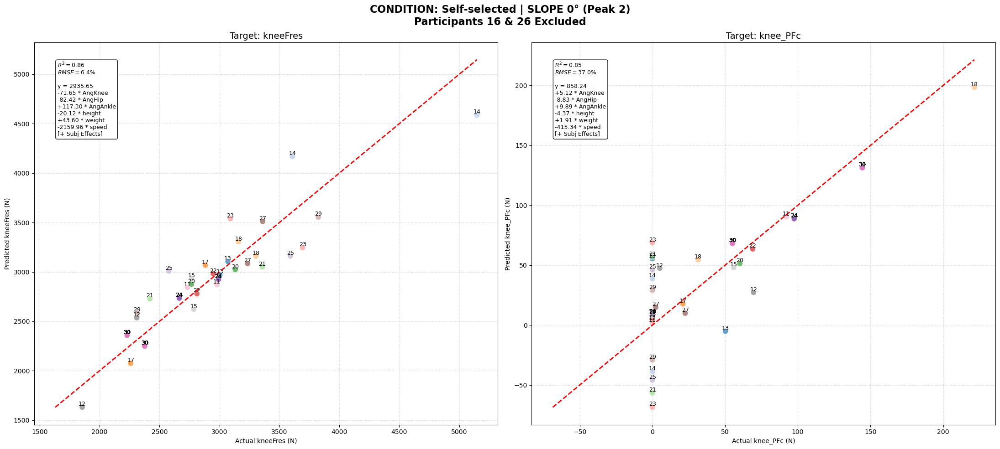

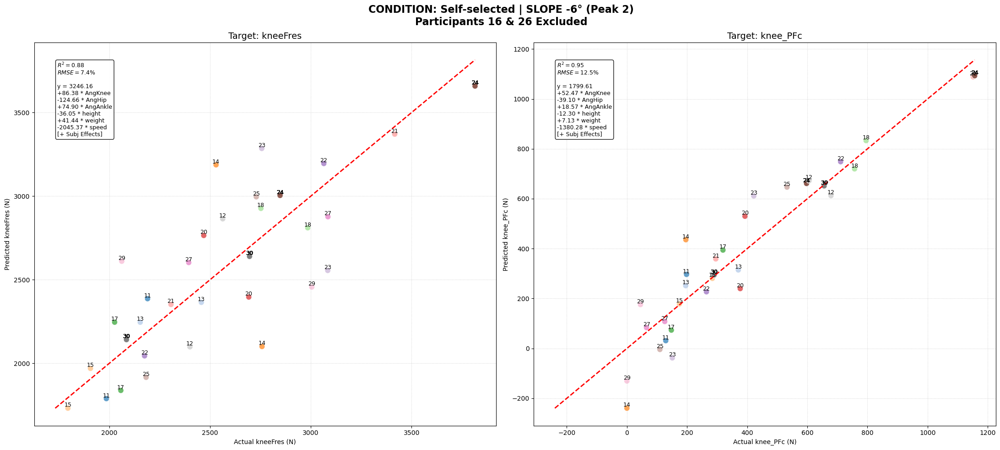

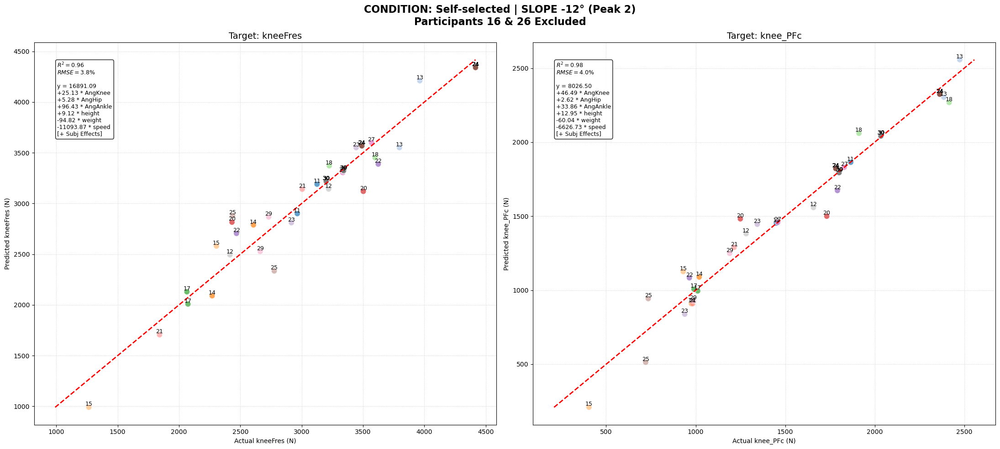

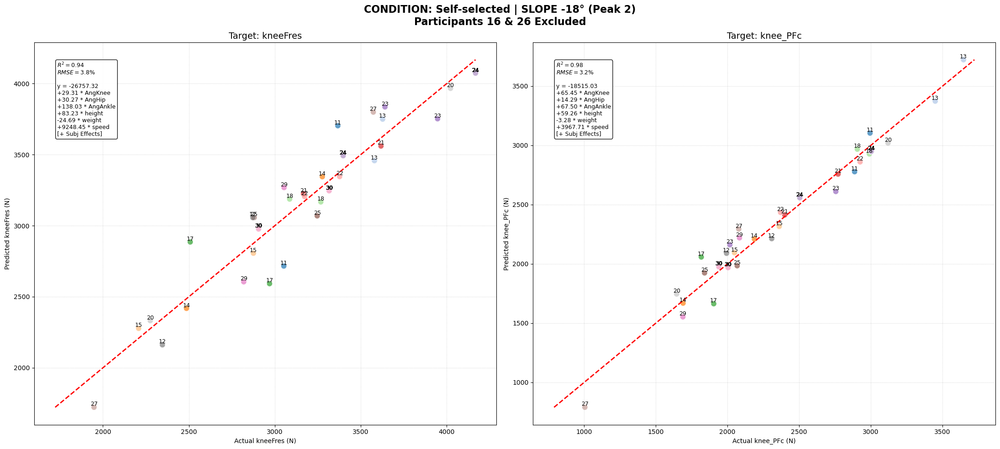

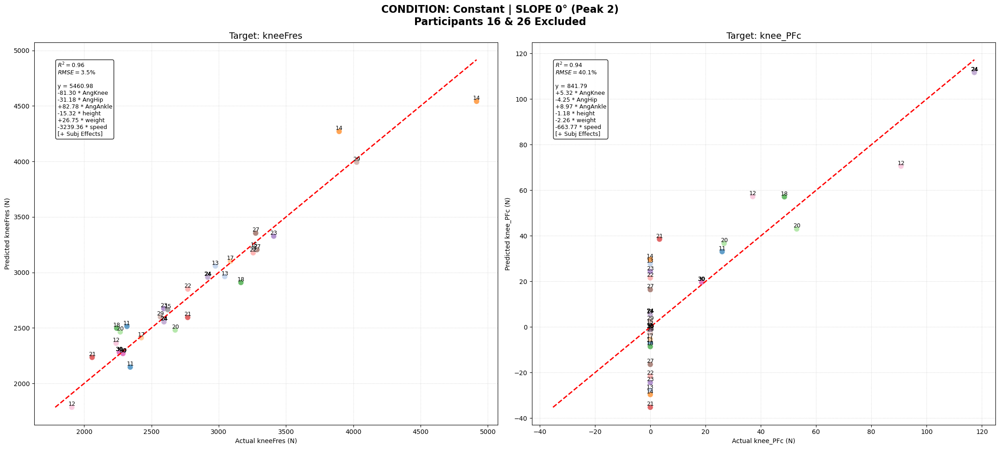

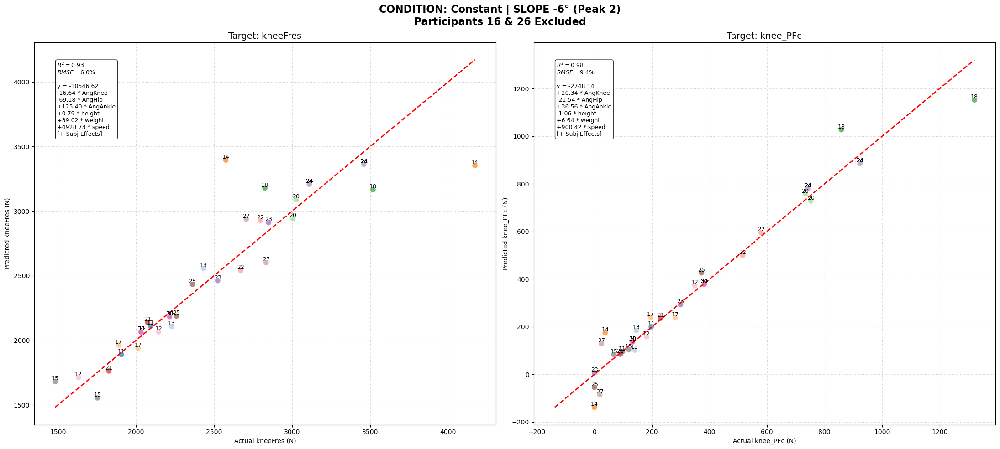

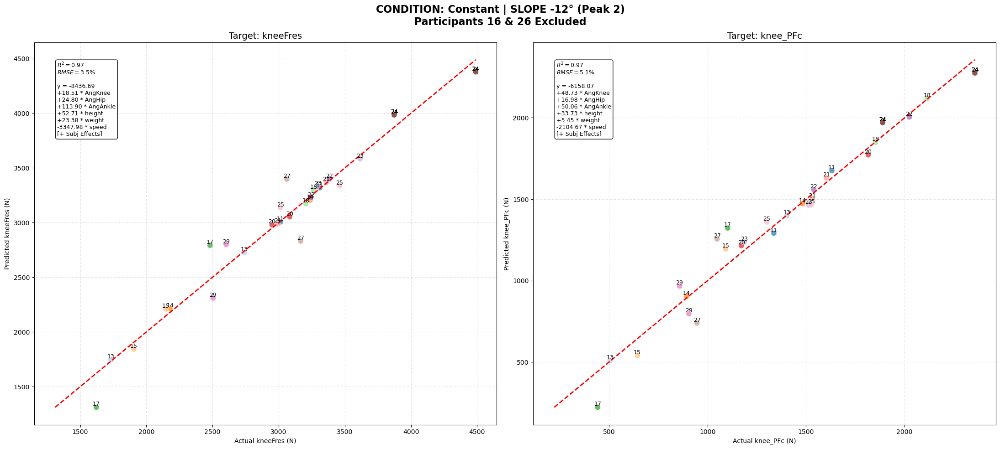

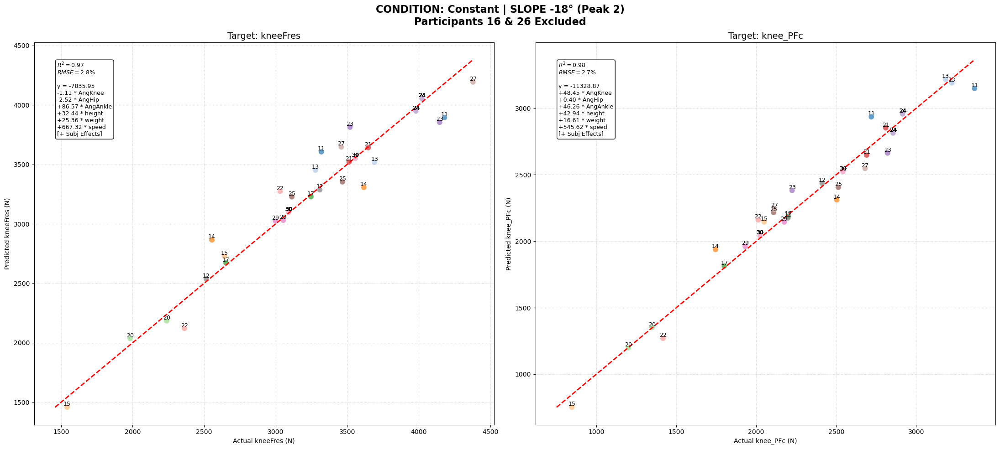


=== DETAILED RESULTS BY CONDITION & SLOPE (PEAK 2) ===


,Condition,Slope,Target,R2,RMSE (%),Equation
0,Self-selected,0,kneeFres,0.863,6.41%,y = 2935.65 -71.65 * AngKnee -82.42 * AngHip +117.30 * AngAnkle -20.12 * height +43.60 * weight -2159.96 * speed [+ Subj Effects]
1,Self-selected,0,knee_PFc,0.847,36.99%,y = 858.24 +5.12 * AngKnee -8.83 * AngHip +9.89 * AngAnkle -4.37 * height +1.91 * weight -415.34 * speed [+ Subj Effects]
2,Self-selected,-6,kneeFres,0.881,7.38%,y = 3246.16 +86.38 * AngKnee -124.66 * AngHip +74.90 * AngAnkle -36.05 * height +41.44 * weight -2045.37 * speed [+ Subj Effects]
3,Self-selected,-6,knee_PFc,0.955,12.54%,y = 1799.61 +52.47 * AngKnee -39.10 * AngHip +18.57 * AngAnkle -12.30 * height +7.13 * weight -1380.28 * speed [+ Subj Effects]
4,Self-selected,-12,kneeFres,0.960,3.78%,y = 16891.09 +25.13 * AngKnee +5.28 * AngHip +96.43 * AngAnkle +9.12 * height -94.82 * weight -11093.87 * speed [+ Subj Effects]
5,Self-selected,-12,knee_PFc,0.975,3.99%,y = 8026.50 +46.49 * AngKnee +2.62 * AngHip +33.86 * AngAnkle +12.95 * height -60.04 * weight -6626.73 * speed [+ Subj Effects]
6,Self-selected,-18,kneeFres,0.938,3.75%,y = -26757.32 +29.31 * AngKnee +30.27 * AngHip +138.03 * AngAnkle +83.23 * height -24.69 * weight +9248.45 * speed [+ Subj Effects]
7,Self-selected,-18,knee_PFc,0.976,3.21%,y = -18515.03 +65.45 * AngKnee +14.29 * AngHip +67.50 * AngAnkle +59.26 * height -3.28 * weight +3967.71 * speed [+ Subj Effects]
8,Constant,0,kneeFres,0.959,3.53%,y = 5460.98 -81.30 * AngKnee -31.18 * AngHip +82.78 * AngAnkle -15.32 * height +26.75 * weight -3239.36 * speed [+ Subj Effects]
9,Constant,0,knee_PFc,0.938,40.10%,y = 841.79 +5.32 * AngKnee -4.25 * AngHip +8.97 * AngAnkle -1.18 * height -2.26 * weight -663.77 * speed [+ Subj Effects]


In [26]:
# ==============================================================================
# --- 1. SETUP PARAMETERS (PEAK 2) ---
# ==============================================================================
targets = ['kneeFres', 'knee_PFc'] 
event_type = 'Second_Peak_GRF' # <--- PEAK 2
slopes = [0, -6, -12, -18]
conditions = ['Self-selected', 'Constant'] # <--- Separation

# Features
features_per_slope = ['angleKnee', 'angleHip', 'angleAnkle', 'height', 'weight', 'speed']

# --- PREPARE DATA ---
# Label dataframes before merging
df_peak2_self_selected['Condition'] = 'Self-selected'
df_peak2_constant['Condition'] = 'Constant'

# Combine
df_global_p2 = pd.concat([df_peak2_self_selected, df_peak2_constant], ignore_index=True)

# Filter for Peak 2
df_global_p2 = df_global_p2[df_global_p2['Event_Type'] == event_type].copy()
df_global_p2['id'] = df_global_p2['id'].astype(str).str.strip()

# EXCLUSION PARTICIPANTS 16 & 26 (Cohorte Clean)
participants_to_exclude = ['16', '26']
df_global_p2 = df_global_p2[~df_global_p2['id'].isin(participants_to_exclude)].copy()

print(f"--- DETAILED ANALYSIS (PEAK 2) ---")
print(f"Splitting by Condition: {conditions}")
print(f"Excluded participants : {participants_to_exclude}")
print(f"Total samples: {len(df_global_p2)}")

# ==============================================================================
# --- 2. MAIN LOOP (CONDITION -> SLOPE) ---
# ==============================================================================
results_split_p2 = []

# OUTER LOOP: CONDITION
for condition in conditions:
    
    # Filter by Condition
    df_cond = df_global_p2[df_global_p2['Condition'] == condition].copy()

    # INNER LOOP: SLOPE
    for slope in slopes:
        
        # Filter by Slope
        df_slope = df_cond[df_cond['slope'] == slope].copy()
        
        # Check data sufficiency
        if len(df_slope) < 8:
            print(f"Skipping {condition} / Slope {slope}: Not enough data.")
            continue

        # 2. Figure
        fig, axes = plt.subplots(1, 2, figsize=(22, 10))
        fig.suptitle(f"CONDITION: {condition} | SLOPE {slope}° (Peak 2)\nParticipants 16 & 26 Excluded", 
                     fontsize=16, fontweight='bold')
        
        # 3. Loop Targets
        for i, target in enumerate(targets):
            ax = axes[i]
            
            # A. Data Cleaning
            cols_needed = features_per_slope + [target, 'id']
            data_clean = df_slope.dropna(subset=cols_needed).copy()
            
            if len(data_clean) == 0: continue
            
            # B. Model
            participant_dummies = pd.get_dummies(data_clean['id'], prefix='Subj', drop_first=True)
            X = pd.concat([data_clean[features_per_slope], participant_dummies], axis=1)
            y = data_clean[target]
            
            model = LinearRegression()
            model.fit(X, y)
            y_pred = model.predict(X)
            
            # C. Stats
            r2 = r2_score(y, y_pred)
            rmse_val = np.sqrt(mean_squared_error(y, y_pred))
            
            # --- RMSE % (NRMSE) ---
            mean_y = np.mean(y)
            rmse_pct = (rmse_val / mean_y) * 100
            
            # Equation
            eq_str = f"y = {model.intercept_:.2f}"
            for name, coef in zip(X.columns, model.coef_):
                if 'Subj' not in name:
                    clean_name = name.replace("angle", "Ang")
                    eq_str += f"\n{coef:+.2f} * {clean_name}"
            eq_str += "\n[+ Subj Effects]" 
            
            results_split_p2.append({
                'Condition': condition,
                'Slope': slope, 
                'Target': target,
                'R2': r2, 
                'RMSE (%)': rmse_pct, 
                'Equation': eq_str.replace('\n', ' ')
            })
            
            # D. VISUALIZATION
            
            # Scatterplot
            sns.scatterplot(
                x=y, y=y_pred, 
                hue=data_clean['id'], palette='tab20', 
                s=80, alpha=0.7, ax=ax,
                legend=False 
            )
            
            # Labels
            for actual, predicted, pid in zip(y, y_pred, data_clean['id']):
                ax.text(actual, predicted, pid, 
                        fontsize=9, color='black', ha='center', va='bottom', fontweight='light')
            
            # Perfect Fit
            min_val = min(y.min(), y_pred.min())
            max_val = max(y.max(), y_pred.max())
            ax.plot([min_val, max_val], [min_val, max_val], color='red', linestyle='--', linewidth=2, label='Perfect Fit')
            
            # Stats Box
            text_str = f"$R^2 = {r2:.2f}$\n$RMSE = {rmse_pct:.1f}\%$\n\n{eq_str}"
            props = dict(boxstyle='round', facecolor='white', alpha=0.9, edgecolor='black')
            ax.text(0.05, 0.95, text_str, transform=ax.transAxes, fontsize=9, verticalalignment='top', bbox=props)
            
            ax.set_title(f"Target: {target}", fontsize=14)
            ax.set_xlabel(f"Actual {target} (N)")
            ax.set_ylabel(f"Predicted {target} (N)")
            ax.grid(True, linestyle=':', alpha=0.6)
            
        plt.tight_layout()
        plt.show()

# --- SUMMARY TABLE ---
print("\n=== DETAILED RESULTS BY CONDITION & SLOPE (PEAK 2) ===")
summary_df_p2 = pd.DataFrame(results_split_p2)

# Formatting
summary_df_p2['R2'] = summary_df_p2['R2'].map('{:.3f}'.format)
summary_df_p2['RMSE (%)'] = summary_df_p2['RMSE (%)'].map('{:.2f}%'.format)

# Reorder
cols_order = ['Condition', 'Slope', 'Target', 'R2', 'RMSE (%)', 'Equation']
summary_df_p2 = summary_df_p2[cols_order]

pd.set_option('display.max_colwidth', None)
display(summary_df_p2)